In [0]:
# # %tensorflow_version only exists in Colab.
%tensorflow_version 2.x

TensorFlow 2.x selected.


# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![GAN examples](https://drive.google.com/uc?id=1UP1VpQ8w-VjT9mckx_aRXMvZrQoy6zpN)


## Setup

In [0]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

DRIVE_DIR = '/content/drive/My Drive/uu_deep_learning_data/gan'

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load(os.path.join(DRIVE_DIR, 'gan-checks-tf.npz'))

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [0]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

11493376/11490434 [==============================] - 0s 0us/step


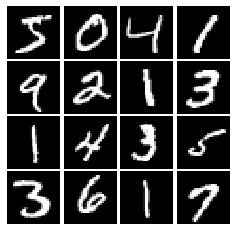

In [0]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [0]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(alpha*x, x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [0]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [0]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform(shape=(batch_size, dim), minval=-1, maxval=1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [0]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [0]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        
        tf.keras.layers.Dense(256, input_shape=(784,), activation=leaky_relu),
        tf.keras.layers.Dense(256, activation=leaky_relu),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [0]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [0]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(1024, input_shape=(noise_dim,), activation=tf.nn.relu),
        tf.keras.layers.Dense(1024, activation=tf.nn.relu),
        tf.keras.layers.Dense(784, activation=tf.nn.tanh)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [0]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [0]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

    real_loss = cross_entropy(tf.ones_like(logits_real), logits_real)
    fake_loss = cross_entropy(tf.zeros_like(logits_fake), logits_fake)

    loss = real_loss + fake_loss

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

    loss = cross_entropy(tf.ones_like(logits_fake), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [0]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [0]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [0]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.optimizers.Adam(learning_rate=1e-3, beta_1=0.5)
    G_solver = tf.optimizers.Adam(learning_rate=1e-3, beta_1=0.5)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [0]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.555, G:0.705
Instructions for updating:
Use tf.identity instead.


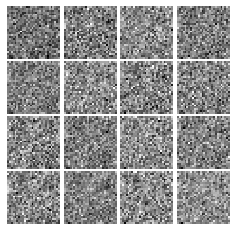

Epoch: 0, Iter: 20, D: 0.566, G:1.027


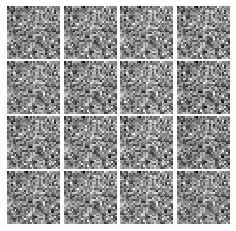

Epoch: 0, Iter: 40, D: 0.7041, G:0.9119


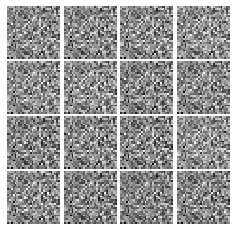

Epoch: 0, Iter: 60, D: 1.482, G:0.7462


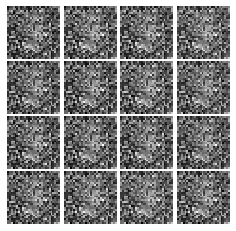

Epoch: 0, Iter: 80, D: 1.05, G:1.153


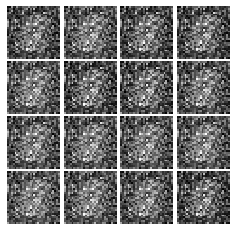

Epoch: 0, Iter: 100, D: 1.512, G:1.585


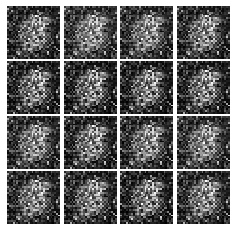

Epoch: 0, Iter: 120, D: 1.443, G:0.5607


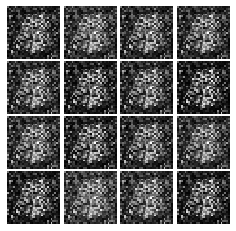

Epoch: 0, Iter: 140, D: 0.9857, G:1.49


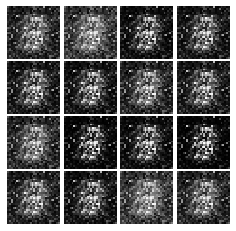

Epoch: 0, Iter: 160, D: 1.799, G:0.7626


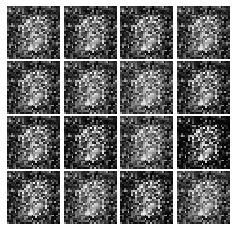

Epoch: 0, Iter: 180, D: 1.144, G:1.376


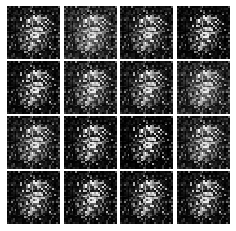

Epoch: 0, Iter: 200, D: 0.9975, G:1.448


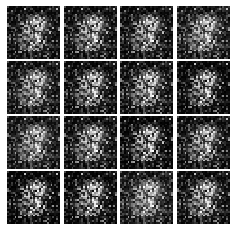

Epoch: 0, Iter: 220, D: 1.582, G:0.5244


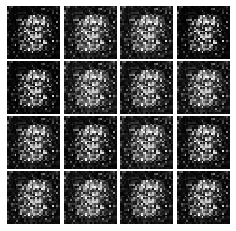

Epoch: 0, Iter: 240, D: 1.68, G:1.575


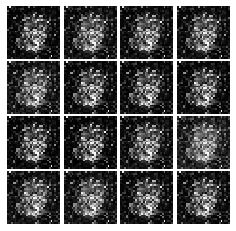

Epoch: 0, Iter: 260, D: 1.792, G:0.5965


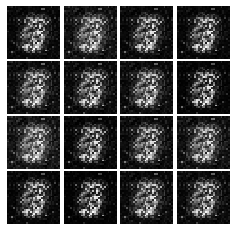

Epoch: 0, Iter: 280, D: 1.178, G:1.103


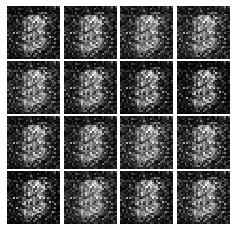

Epoch: 0, Iter: 300, D: 1.333, G:1.681


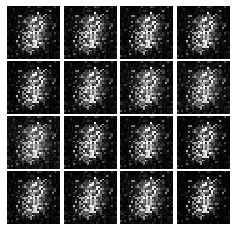

Epoch: 0, Iter: 320, D: 1.179, G:1.402


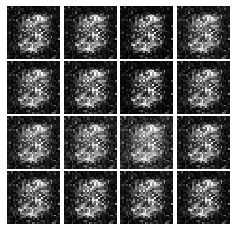

Epoch: 0, Iter: 340, D: 0.679, G:1.609


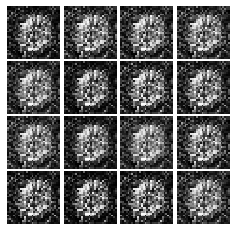

Epoch: 0, Iter: 360, D: 1.545, G:2.075


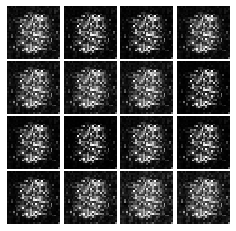

Epoch: 0, Iter: 380, D: 0.9808, G:1.367


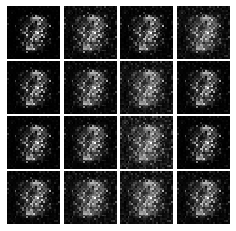

Epoch: 0, Iter: 400, D: 0.8956, G:2.197


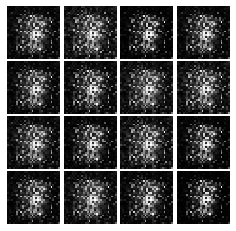

Epoch: 0, Iter: 420, D: 1.62, G:2.071


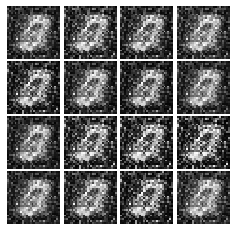

Epoch: 0, Iter: 440, D: 2.102, G:0.7064


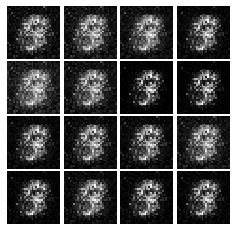

Epoch: 0, Iter: 460, D: 1.458, G:5.084


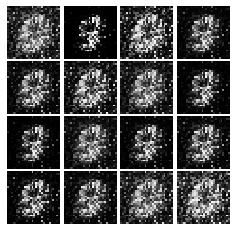

Epoch: 1, Iter: 480, D: 1.114, G:1.078


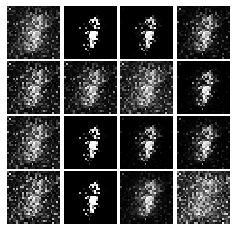

Epoch: 1, Iter: 500, D: 0.8373, G:1.868


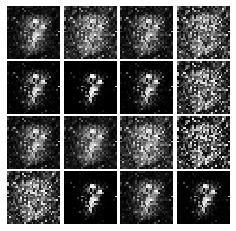

Epoch: 1, Iter: 520, D: 1.295, G:1.859


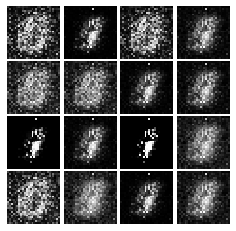

Epoch: 1, Iter: 540, D: 1.045, G:0.4742


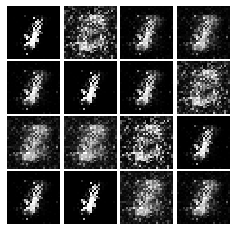

Epoch: 1, Iter: 560, D: 0.6968, G:1.947


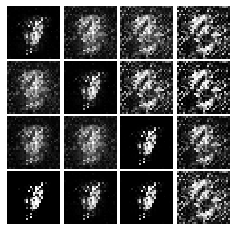

Epoch: 1, Iter: 580, D: 1.241, G:1.328


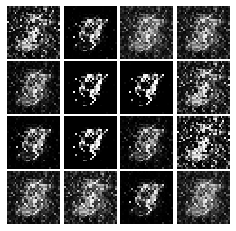

Epoch: 1, Iter: 600, D: 1.311, G:2.094


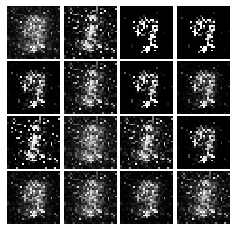

Epoch: 1, Iter: 620, D: 0.8139, G:1.571


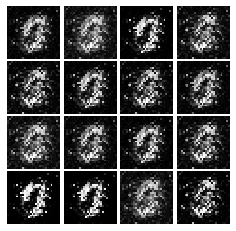

Epoch: 1, Iter: 640, D: 0.9985, G:0.9166


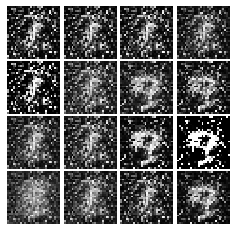

Epoch: 1, Iter: 660, D: 1.184, G:1.385


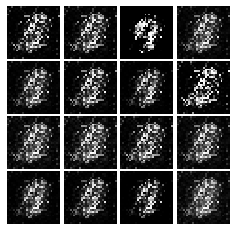

Epoch: 1, Iter: 680, D: 1.436, G:1.034


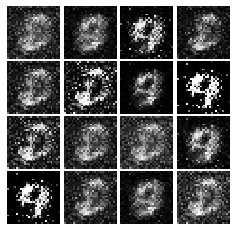

Epoch: 1, Iter: 700, D: 1.132, G:1.607


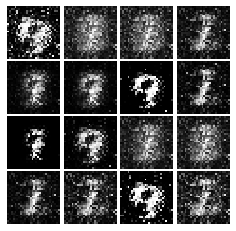

Epoch: 1, Iter: 720, D: 0.9063, G:1.421


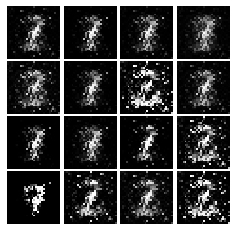

Epoch: 1, Iter: 740, D: 1.099, G:1.177


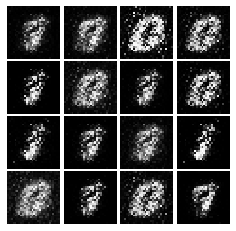

Epoch: 1, Iter: 760, D: 1.125, G:1.256


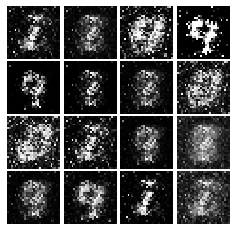

Epoch: 1, Iter: 780, D: 1.057, G:1.551


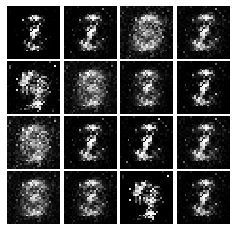

Epoch: 1, Iter: 800, D: 1.009, G:1.328


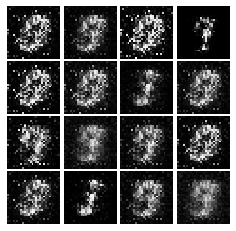

Epoch: 1, Iter: 820, D: 1.163, G:1.143


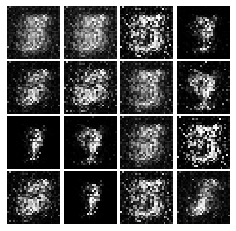

Epoch: 1, Iter: 840, D: 1.149, G:1.157


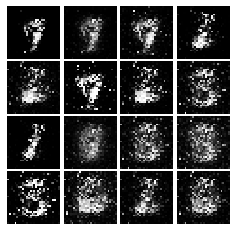

Epoch: 1, Iter: 860, D: 1.138, G:1.46


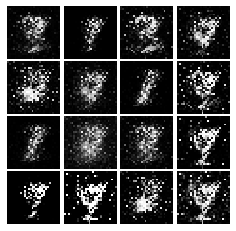

Epoch: 1, Iter: 880, D: 1.119, G:0.362


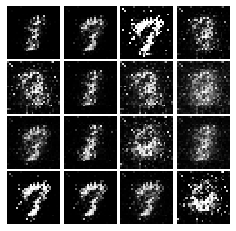

Epoch: 1, Iter: 900, D: 1.367, G:0.717


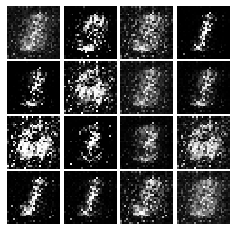

Epoch: 1, Iter: 920, D: 1.202, G:1.806


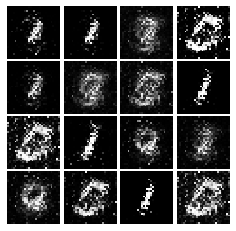

Epoch: 2, Iter: 940, D: 1.347, G:0.6543


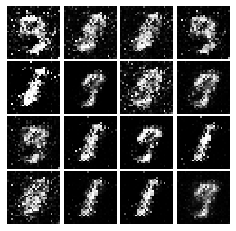

Epoch: 2, Iter: 960, D: 0.9077, G:1.616


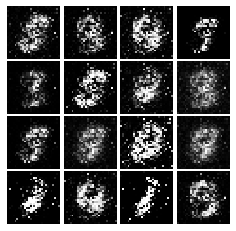

Epoch: 2, Iter: 980, D: 1.097, G:1.542


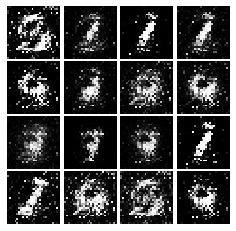

Epoch: 2, Iter: 1000, D: 1.104, G:0.9492


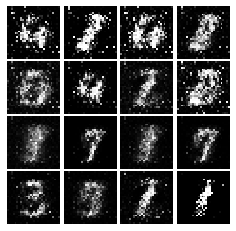

Epoch: 2, Iter: 1020, D: 0.9573, G:1.645


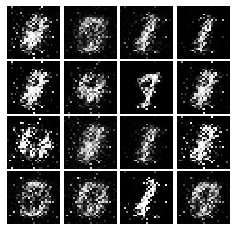

Epoch: 2, Iter: 1040, D: 1.321, G:1.151


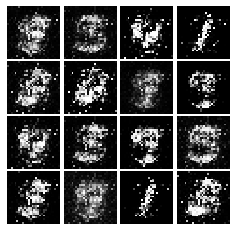

Epoch: 2, Iter: 1060, D: 1.482, G:1.08


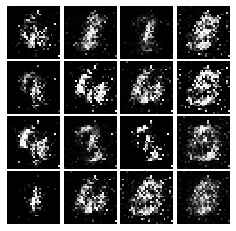

Epoch: 2, Iter: 1080, D: 1.115, G:1.123


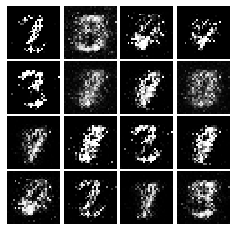

Epoch: 2, Iter: 1100, D: 1.021, G:1.38


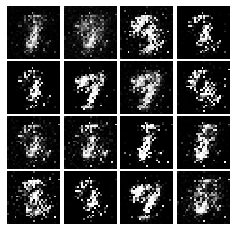

Epoch: 2, Iter: 1120, D: 0.9197, G:3.035


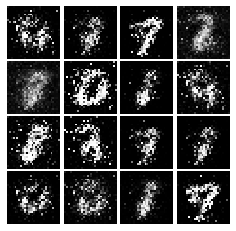

Epoch: 2, Iter: 1140, D: 1.221, G:2.053


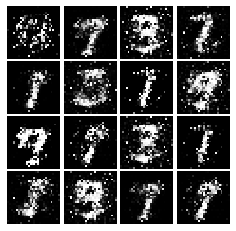

Epoch: 2, Iter: 1160, D: 1.193, G:1.022


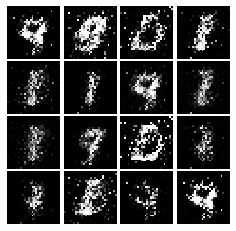

Epoch: 2, Iter: 1180, D: 1.105, G:2.586


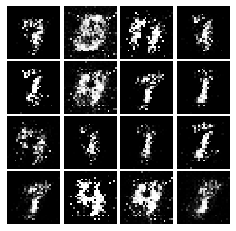

Epoch: 2, Iter: 1200, D: 1.144, G:1.404


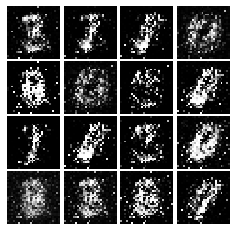

Epoch: 2, Iter: 1220, D: 1.082, G:1.806


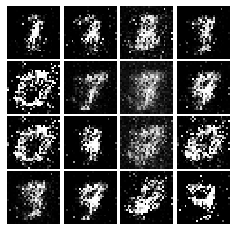

Epoch: 2, Iter: 1240, D: 1.123, G:1.097


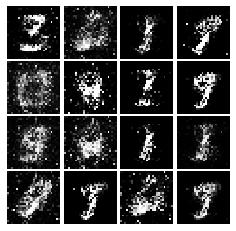

Epoch: 2, Iter: 1260, D: 0.9375, G:1.783


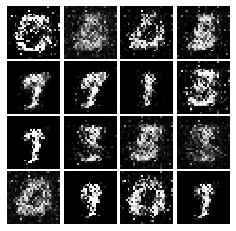

Epoch: 2, Iter: 1280, D: 1.37, G:1.59


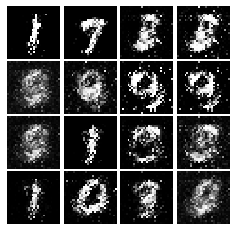

Epoch: 2, Iter: 1300, D: 1.169, G:1.35


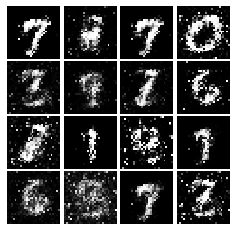

Epoch: 2, Iter: 1320, D: 1.406, G:0.9815


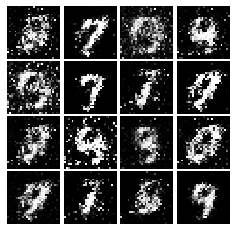

Epoch: 2, Iter: 1340, D: 1.279, G:1.101


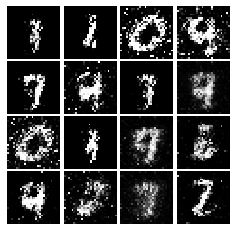

Epoch: 2, Iter: 1360, D: 1.065, G:1.277


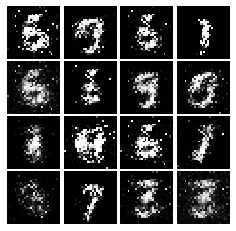

Epoch: 2, Iter: 1380, D: 0.9969, G:1.337


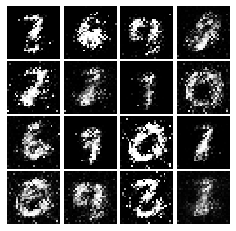

Epoch: 2, Iter: 1400, D: 1.3, G:1.068


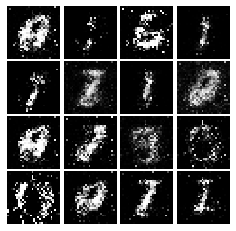

Epoch: 3, Iter: 1420, D: 1.195, G:0.9886


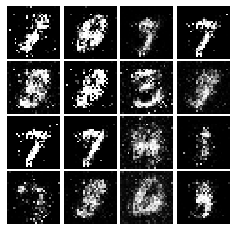

Epoch: 3, Iter: 1440, D: 1.057, G:1.19


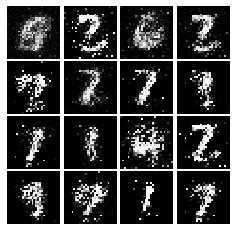

Epoch: 3, Iter: 1460, D: 1.138, G:1.103


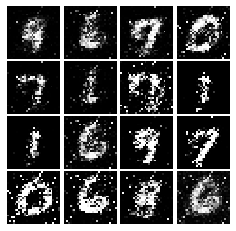

Epoch: 3, Iter: 1480, D: 1.24, G:1.137


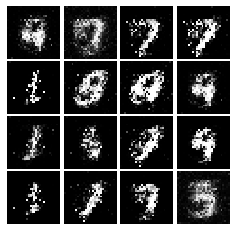

Epoch: 3, Iter: 1500, D: 1.123, G:1.067


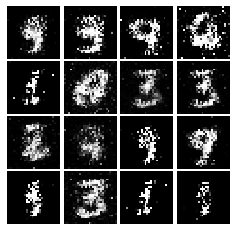

Epoch: 3, Iter: 1520, D: 1.219, G:0.8542


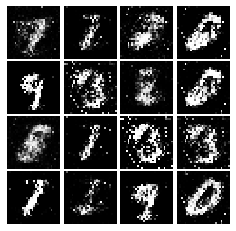

Epoch: 3, Iter: 1540, D: 1.243, G:0.8427


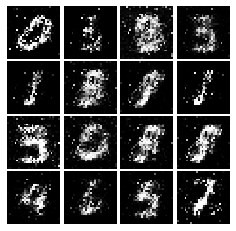

Epoch: 3, Iter: 1560, D: 1.07, G:1.307


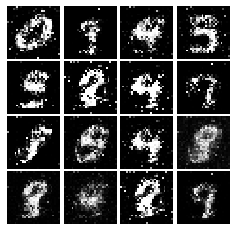

Epoch: 3, Iter: 1580, D: 1.235, G:1.021


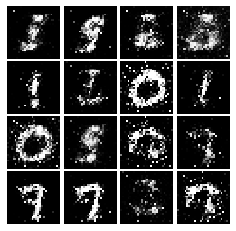

Epoch: 3, Iter: 1600, D: 1.511, G:1.249


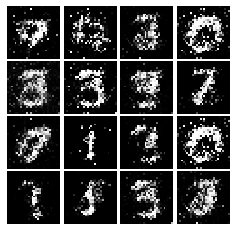

Epoch: 3, Iter: 1620, D: 1.292, G:3.859


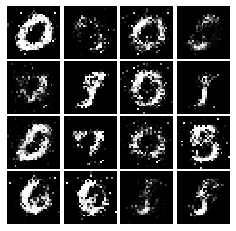

Epoch: 3, Iter: 1640, D: 1.141, G:0.9375


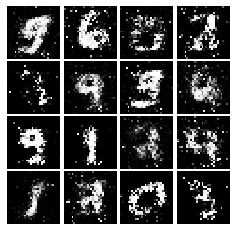

Epoch: 3, Iter: 1660, D: 0.9188, G:1.483


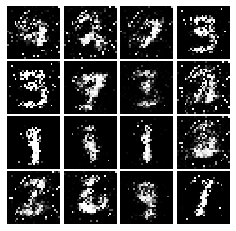

Epoch: 3, Iter: 1680, D: 1.372, G:1.529


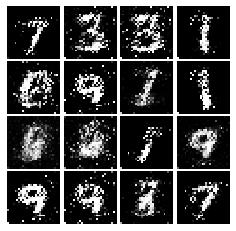

Epoch: 3, Iter: 1700, D: 1.224, G:1.027


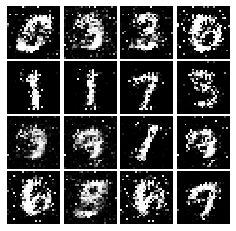

Epoch: 3, Iter: 1720, D: 1.161, G:1.011


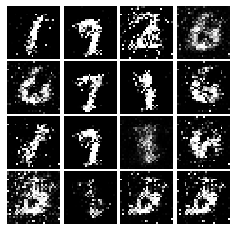

Epoch: 3, Iter: 1740, D: 1.16, G:1.212


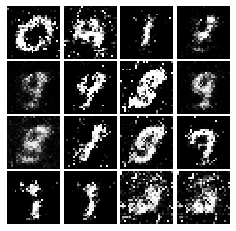

Epoch: 3, Iter: 1760, D: 1.125, G:1.204


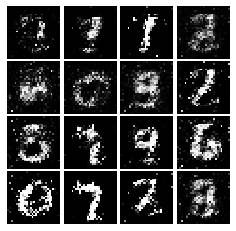

Epoch: 3, Iter: 1780, D: 1.154, G:0.9193


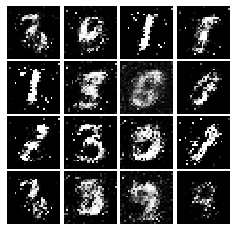

Epoch: 3, Iter: 1800, D: 1.193, G:1.261


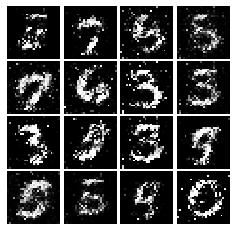

Epoch: 3, Iter: 1820, D: 1.187, G:0.9305


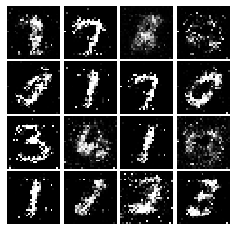

Epoch: 3, Iter: 1840, D: 1.236, G:0.9033


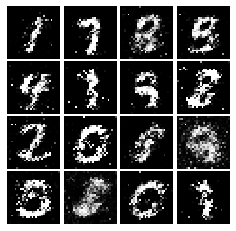

Epoch: 3, Iter: 1860, D: 1.255, G:0.9326


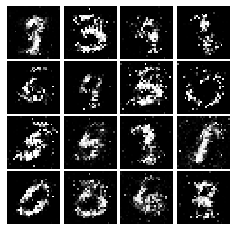

Epoch: 4, Iter: 1880, D: 1.049, G:1.281


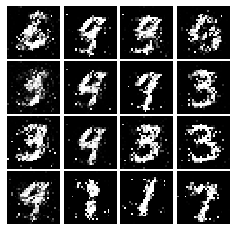

Epoch: 4, Iter: 1900, D: 1.206, G:1.081


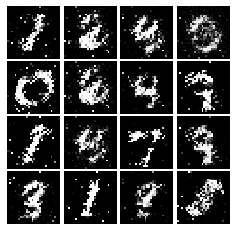

Epoch: 4, Iter: 1920, D: 1.122, G:1.244


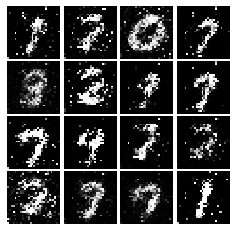

Epoch: 4, Iter: 1940, D: 1.315, G:0.7623


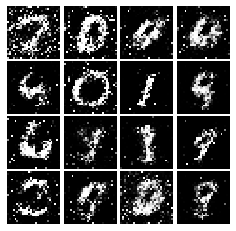

Epoch: 4, Iter: 1960, D: 1.13, G:0.9347


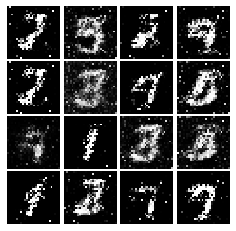

Epoch: 4, Iter: 1980, D: 1.208, G:1.174


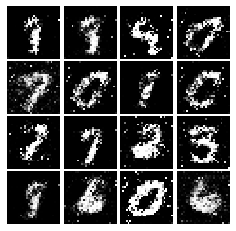

Epoch: 4, Iter: 2000, D: 1.359, G:0.7615


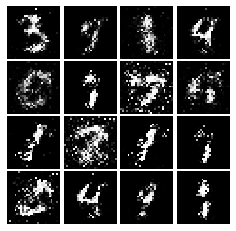

Epoch: 4, Iter: 2020, D: 1.269, G:0.8826


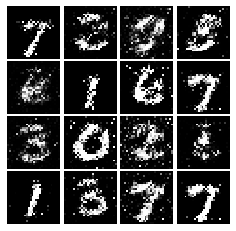

Epoch: 4, Iter: 2040, D: 1.28, G:0.8497


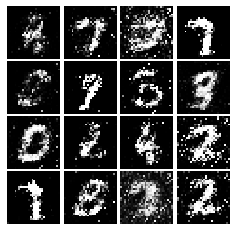

Epoch: 4, Iter: 2060, D: 1.274, G:0.9415


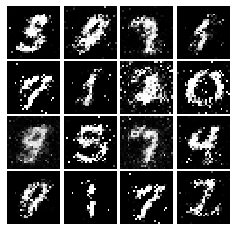

Epoch: 4, Iter: 2080, D: 1.385, G:0.8709


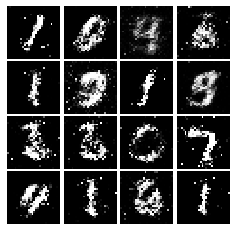

Epoch: 4, Iter: 2100, D: 1.254, G:0.9202


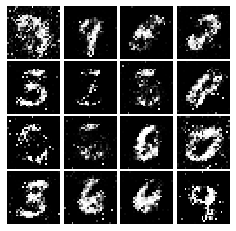

Epoch: 4, Iter: 2120, D: 1.431, G:0.8316


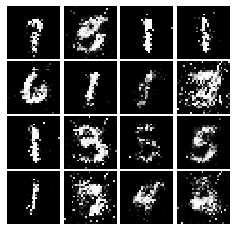

Epoch: 4, Iter: 2140, D: 1.42, G:0.7519


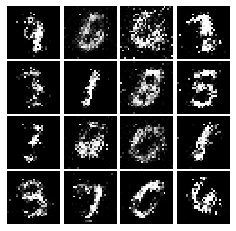

Epoch: 4, Iter: 2160, D: 1.464, G:0.6729


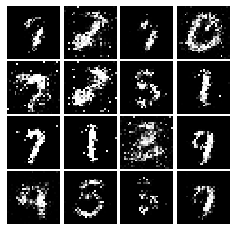

Epoch: 4, Iter: 2180, D: 1.348, G:1.127


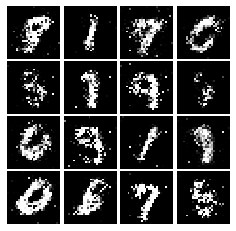

Epoch: 4, Iter: 2200, D: 1.341, G:0.9284


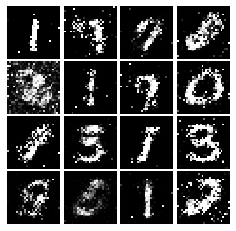

Epoch: 4, Iter: 2220, D: 1.218, G:0.9591


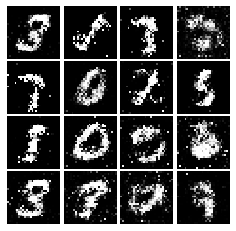

Epoch: 4, Iter: 2240, D: 1.163, G:0.7833


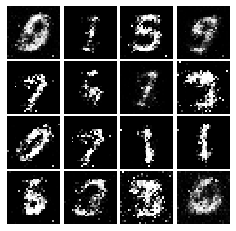

Epoch: 4, Iter: 2260, D: 1.294, G:1.103


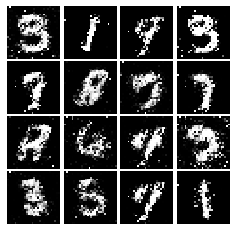

Epoch: 4, Iter: 2280, D: 1.347, G:0.8751


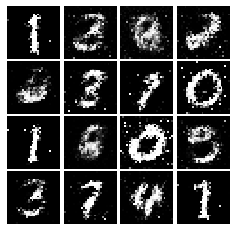

Epoch: 4, Iter: 2300, D: 1.356, G:0.8057


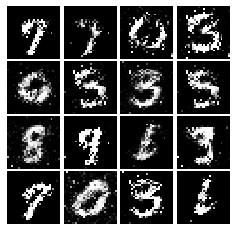

Epoch: 4, Iter: 2320, D: 1.359, G:0.8903


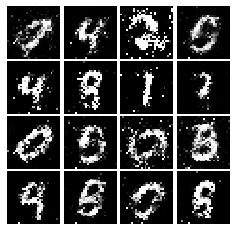

Epoch: 4, Iter: 2340, D: 1.151, G:0.8828


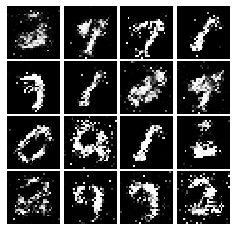

Epoch: 5, Iter: 2360, D: 1.363, G:0.8373


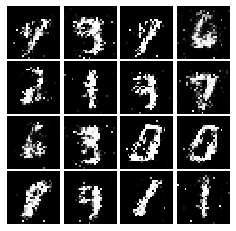

Epoch: 5, Iter: 2380, D: 1.242, G:0.9105


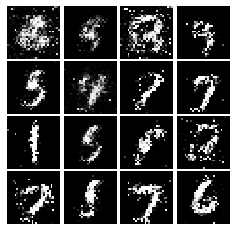

Epoch: 5, Iter: 2400, D: 1.383, G:0.8268


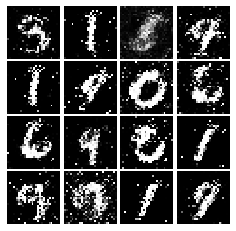

Epoch: 5, Iter: 2420, D: 1.293, G:0.8948


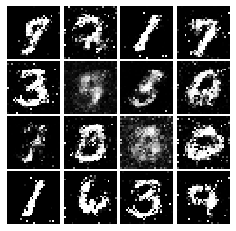

Epoch: 5, Iter: 2440, D: 1.216, G:0.8805


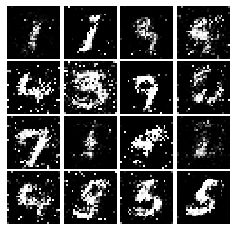

Epoch: 5, Iter: 2460, D: 1.248, G:0.905


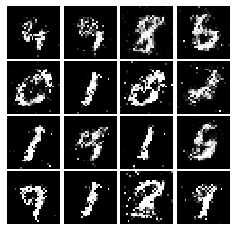

Epoch: 5, Iter: 2480, D: 1.321, G:1.159


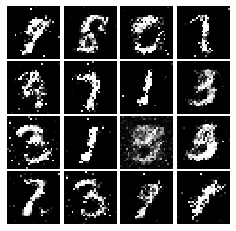

Epoch: 5, Iter: 2500, D: 1.273, G:0.8886


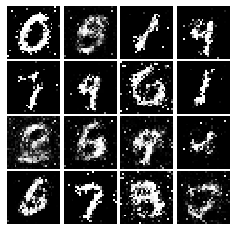

Epoch: 5, Iter: 2520, D: 1.326, G:0.7328


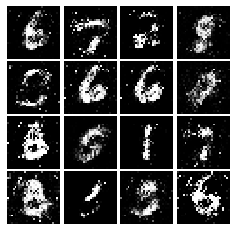

Epoch: 5, Iter: 2540, D: 1.304, G:0.7894


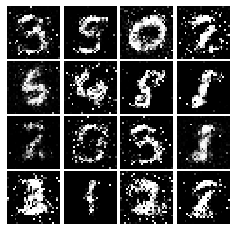

Epoch: 5, Iter: 2560, D: 1.375, G:0.8432


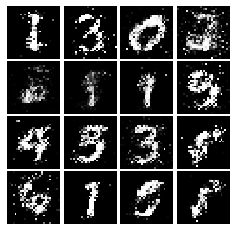

Epoch: 5, Iter: 2580, D: 1.389, G:0.8751


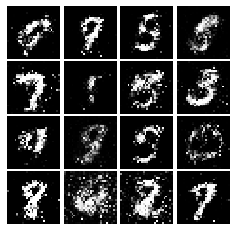

Epoch: 5, Iter: 2600, D: 1.378, G:0.8575


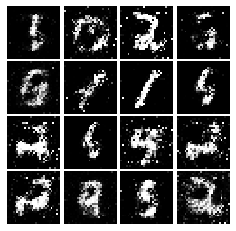

Epoch: 5, Iter: 2620, D: 1.32, G:1.058


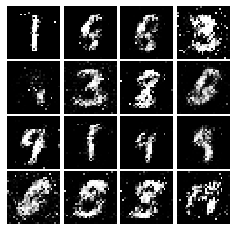

Epoch: 5, Iter: 2640, D: 1.225, G:0.9001


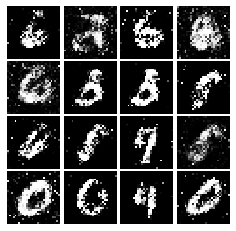

Epoch: 5, Iter: 2660, D: 1.292, G:0.868


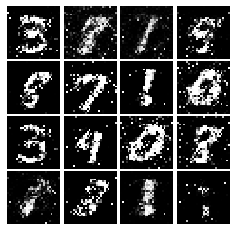

Epoch: 5, Iter: 2680, D: 1.274, G:0.9094


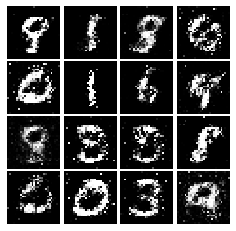

Epoch: 5, Iter: 2700, D: 1.317, G:0.9157


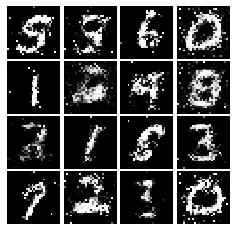

Epoch: 5, Iter: 2720, D: 1.195, G:0.8665


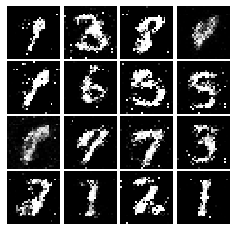

Epoch: 5, Iter: 2740, D: 1.336, G:0.9554


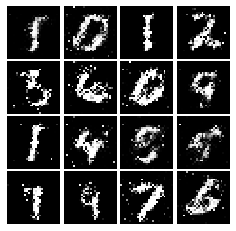

Epoch: 5, Iter: 2760, D: 1.228, G:0.8199


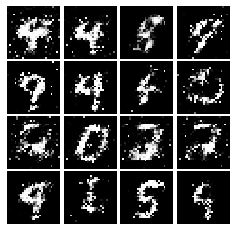

Epoch: 5, Iter: 2780, D: 1.297, G:0.8273


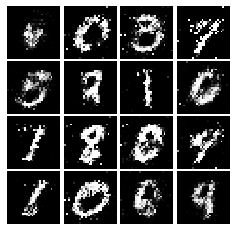

Epoch: 5, Iter: 2800, D: 1.551, G:0.8571


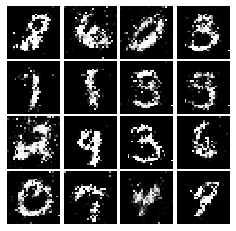

Epoch: 6, Iter: 2820, D: 1.36, G:0.6892


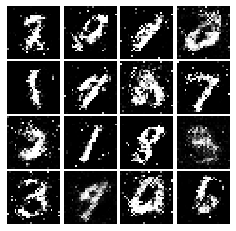

Epoch: 6, Iter: 2840, D: 1.217, G:0.8615


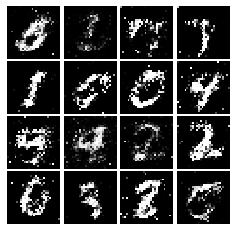

Epoch: 6, Iter: 2860, D: 1.348, G:0.9878


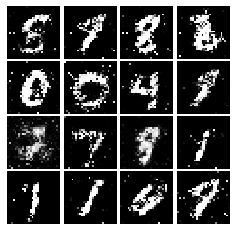

Epoch: 6, Iter: 2880, D: 1.248, G:0.992


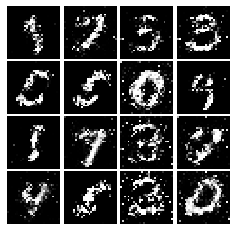

Epoch: 6, Iter: 2900, D: 1.323, G:0.9034


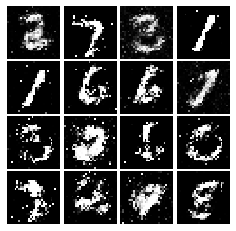

Epoch: 6, Iter: 2920, D: 1.406, G:0.9005


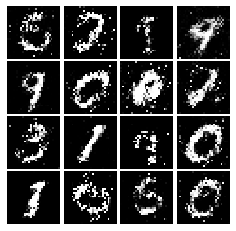

Epoch: 6, Iter: 2940, D: 1.275, G:0.9904


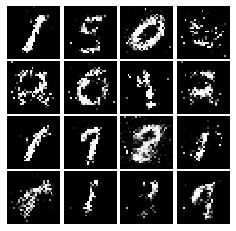

Epoch: 6, Iter: 2960, D: 1.247, G:0.9374


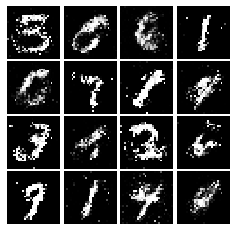

Epoch: 6, Iter: 2980, D: 1.262, G:0.9394


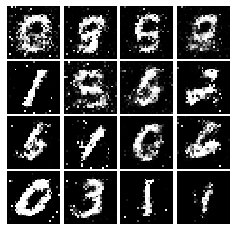

Epoch: 6, Iter: 3000, D: 1.239, G:0.9155


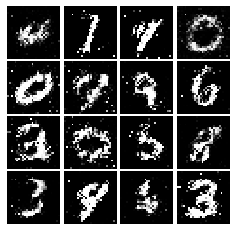

Epoch: 6, Iter: 3020, D: 1.319, G:0.8601


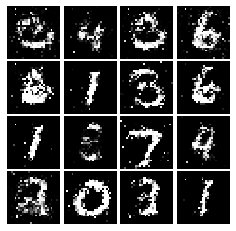

Epoch: 6, Iter: 3040, D: 1.217, G:1.065


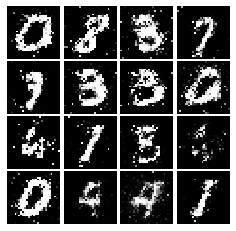

Epoch: 6, Iter: 3060, D: 1.32, G:0.8394


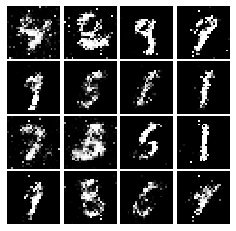

Epoch: 6, Iter: 3080, D: 1.293, G:0.8354


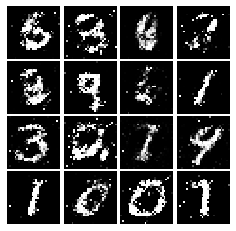

Epoch: 6, Iter: 3100, D: 1.265, G:0.8463


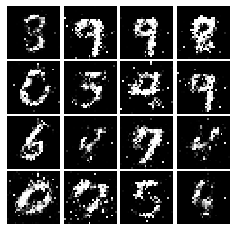

Epoch: 6, Iter: 3120, D: 1.215, G:1.003


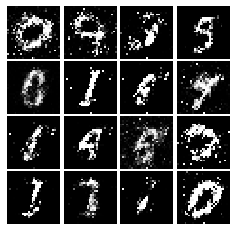

Epoch: 6, Iter: 3140, D: 1.375, G:0.9187


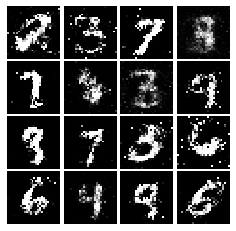

Epoch: 6, Iter: 3160, D: 1.246, G:0.9141


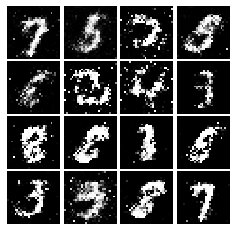

Epoch: 6, Iter: 3180, D: 1.315, G:0.8799


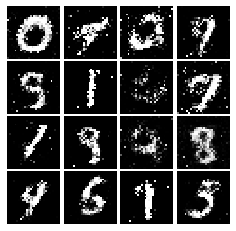

Epoch: 6, Iter: 3200, D: 1.297, G:1.109


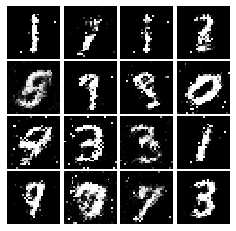

Epoch: 6, Iter: 3220, D: 1.288, G:0.9038


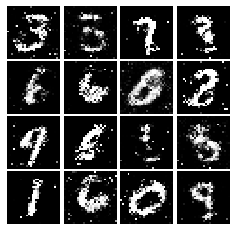

Epoch: 6, Iter: 3240, D: 1.227, G:0.8505


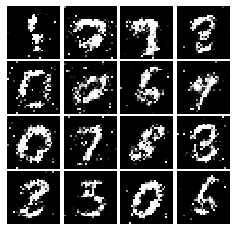

Epoch: 6, Iter: 3260, D: 1.321, G:0.7109


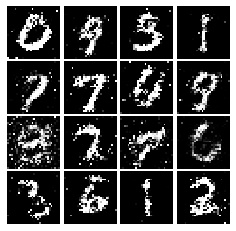

Epoch: 6, Iter: 3280, D: 1.319, G:0.7842


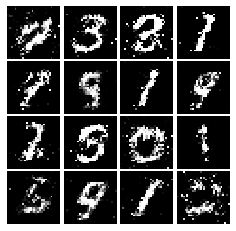

Epoch: 7, Iter: 3300, D: 1.25, G:0.9215


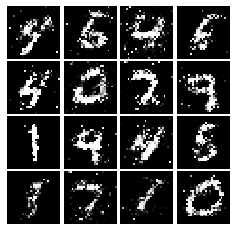

Epoch: 7, Iter: 3320, D: 1.276, G:0.7985


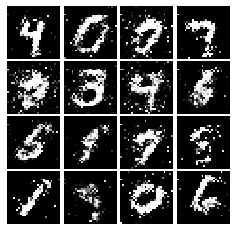

Epoch: 7, Iter: 3340, D: 1.328, G:0.8639


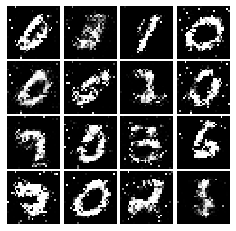

Epoch: 7, Iter: 3360, D: 1.365, G:0.9119


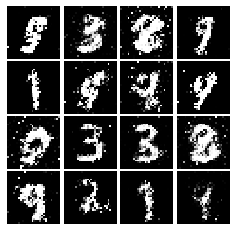

Epoch: 7, Iter: 3380, D: 1.347, G:0.7752


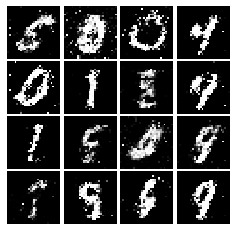

Epoch: 7, Iter: 3400, D: 1.406, G:0.8493


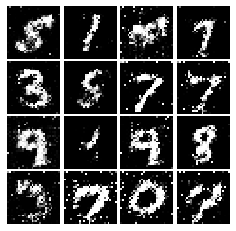

Epoch: 7, Iter: 3420, D: 1.282, G:0.8183


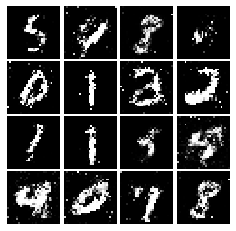

Epoch: 7, Iter: 3440, D: 1.268, G:0.9447


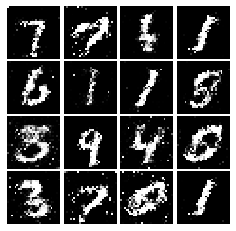

Epoch: 7, Iter: 3460, D: 1.284, G:0.7702


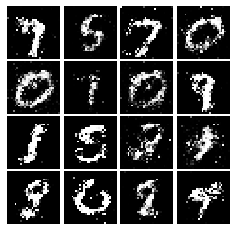

Epoch: 7, Iter: 3480, D: 1.344, G:0.7746


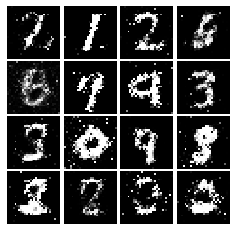

Epoch: 7, Iter: 3500, D: 1.312, G:0.951


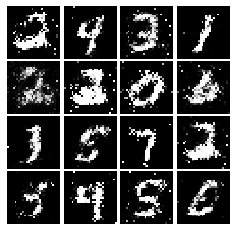

Epoch: 7, Iter: 3520, D: 1.294, G:0.8057


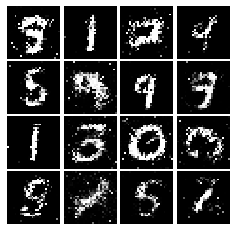

Epoch: 7, Iter: 3540, D: 1.262, G:0.9782


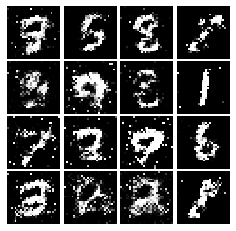

Epoch: 7, Iter: 3560, D: 1.287, G:0.852


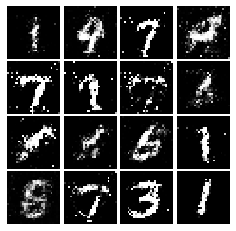

Epoch: 7, Iter: 3580, D: 1.287, G:0.9144


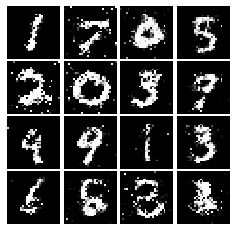

Epoch: 7, Iter: 3600, D: 1.348, G:0.8536


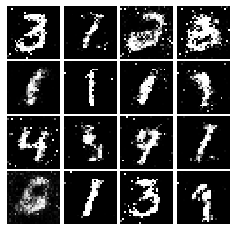

Epoch: 7, Iter: 3620, D: 1.277, G:0.9031


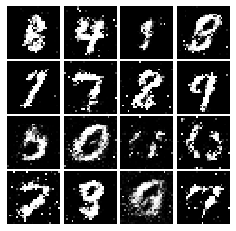

Epoch: 7, Iter: 3640, D: 1.345, G:0.8266


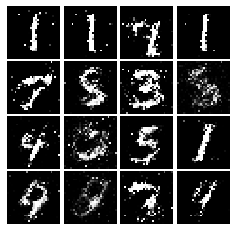

Epoch: 7, Iter: 3660, D: 1.223, G:0.868


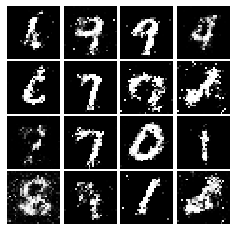

Epoch: 7, Iter: 3680, D: 1.37, G:0.8556


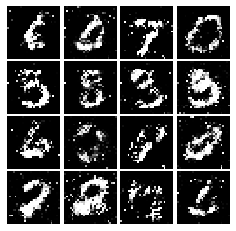

Epoch: 7, Iter: 3700, D: 1.277, G:0.8557


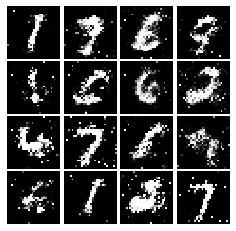

Epoch: 7, Iter: 3720, D: 1.312, G:0.8092


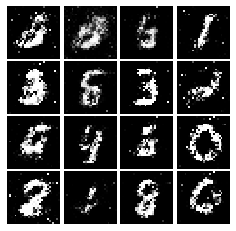

Epoch: 7, Iter: 3740, D: 1.34, G:0.8093


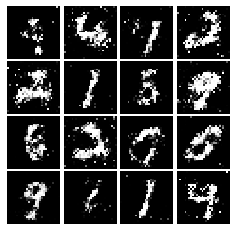

Epoch: 8, Iter: 3760, D: 1.37, G:0.9681


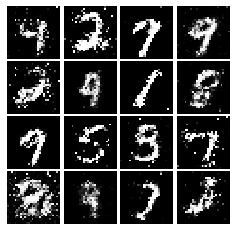

Epoch: 8, Iter: 3780, D: 2.001, G:1.091


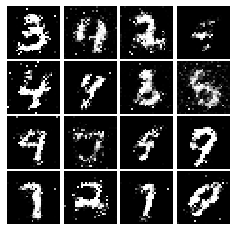

Epoch: 8, Iter: 3800, D: 1.3, G:0.7845


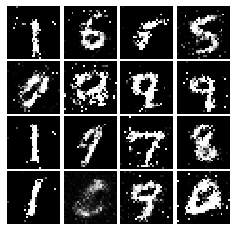

Epoch: 8, Iter: 3820, D: 1.37, G:0.8069


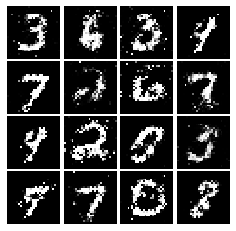

Epoch: 8, Iter: 3840, D: 1.287, G:0.8588


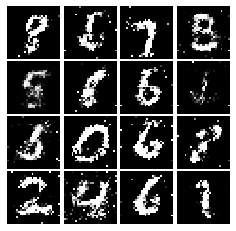

Epoch: 8, Iter: 3860, D: 1.219, G:1.074


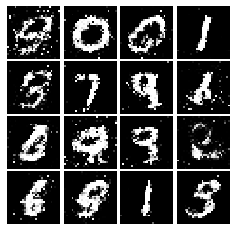

Epoch: 8, Iter: 3880, D: 1.266, G:0.7997


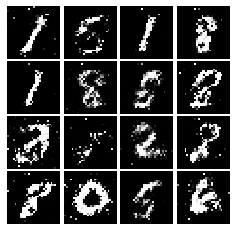

Epoch: 8, Iter: 3900, D: 1.266, G:0.8514


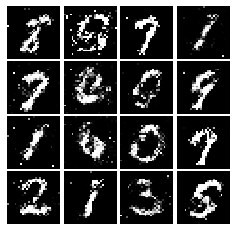

Epoch: 8, Iter: 3920, D: 1.249, G:0.868


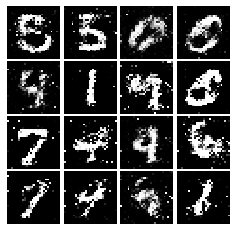

Epoch: 8, Iter: 3940, D: 1.349, G:0.7197


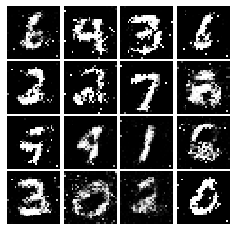

Epoch: 8, Iter: 3960, D: 1.289, G:0.7925


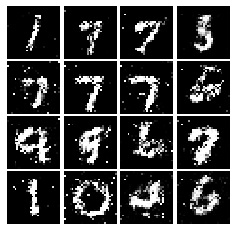

Epoch: 8, Iter: 3980, D: 1.353, G:0.9087


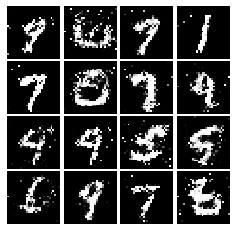

Epoch: 8, Iter: 4000, D: 1.198, G:0.8815


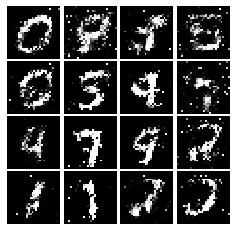

Epoch: 8, Iter: 4020, D: 1.326, G:0.7701


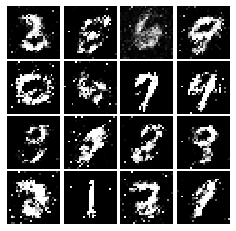

Epoch: 8, Iter: 4040, D: 1.3, G:0.8439


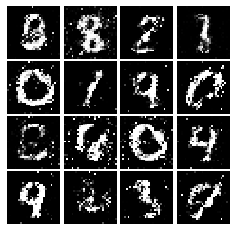

Epoch: 8, Iter: 4060, D: 1.353, G:1.072


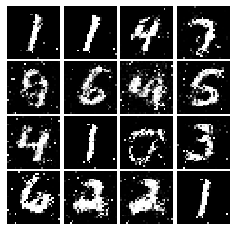

Epoch: 8, Iter: 4080, D: 1.347, G:0.6915


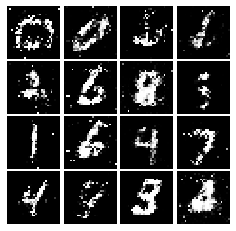

Epoch: 8, Iter: 4100, D: 1.307, G:0.7857


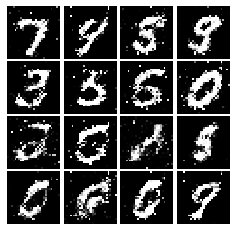

Epoch: 8, Iter: 4120, D: 1.345, G:0.819


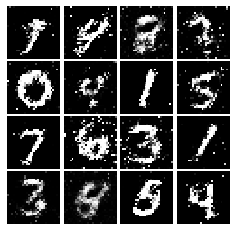

Epoch: 8, Iter: 4140, D: 1.252, G:0.8443


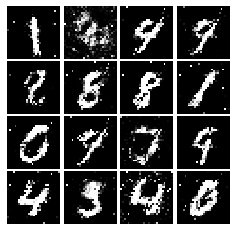

Epoch: 8, Iter: 4160, D: 1.303, G:0.8143


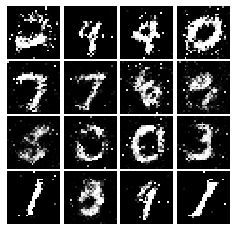

Epoch: 8, Iter: 4180, D: 1.357, G:0.8524


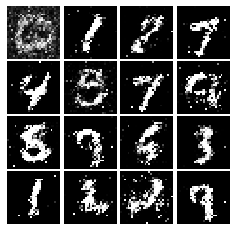

Epoch: 8, Iter: 4200, D: 1.376, G:0.9535


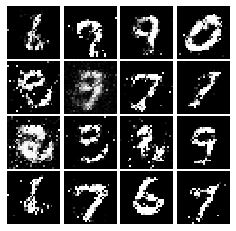

Epoch: 8, Iter: 4220, D: 1.217, G:1.024


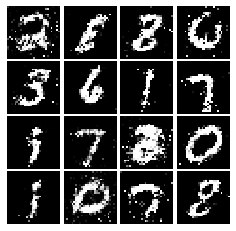

Epoch: 9, Iter: 4240, D: 1.404, G:0.8501


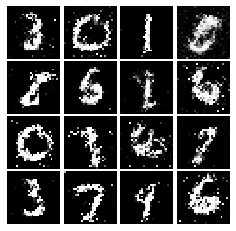

Epoch: 9, Iter: 4260, D: 1.41, G:0.8434


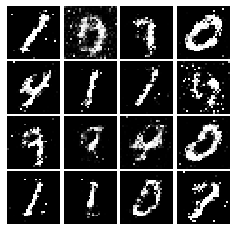

Epoch: 9, Iter: 4280, D: 1.323, G:0.918


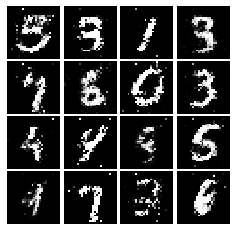

Epoch: 9, Iter: 4300, D: 1.345, G:0.8877


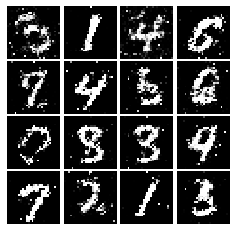

Epoch: 9, Iter: 4320, D: 1.353, G:0.7802


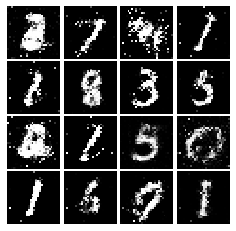

Epoch: 9, Iter: 4340, D: 1.357, G:0.8229


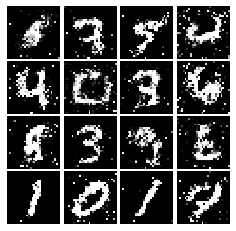

Epoch: 9, Iter: 4360, D: 1.358, G:0.8221


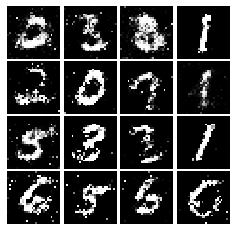

Epoch: 9, Iter: 4380, D: 1.379, G:0.754


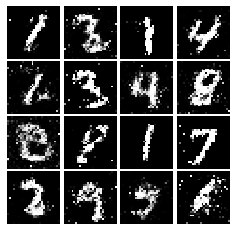

Epoch: 9, Iter: 4400, D: 1.199, G:0.8898


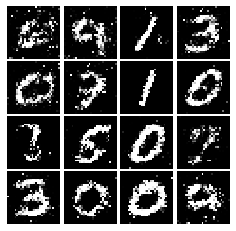

Epoch: 9, Iter: 4420, D: 1.33, G:0.8174


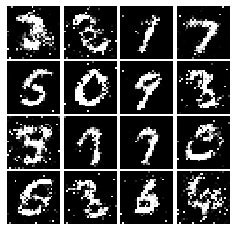

Epoch: 9, Iter: 4440, D: 1.29, G:0.749


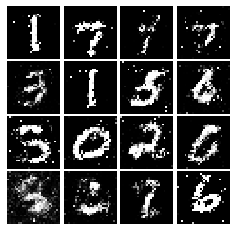

Epoch: 9, Iter: 4460, D: 1.368, G:0.7703


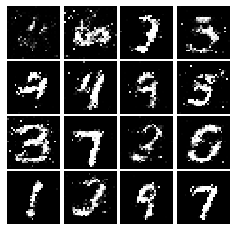

Epoch: 9, Iter: 4480, D: 1.35, G:0.8262


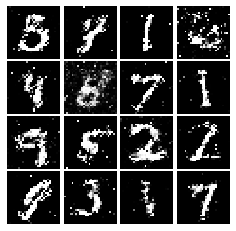

Epoch: 9, Iter: 4500, D: 1.389, G:0.7493


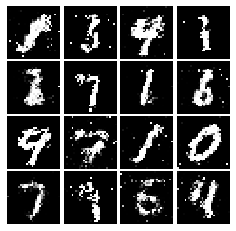

Epoch: 9, Iter: 4520, D: 1.379, G:0.8219


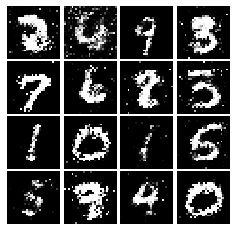

Epoch: 9, Iter: 4540, D: 1.319, G:0.7218


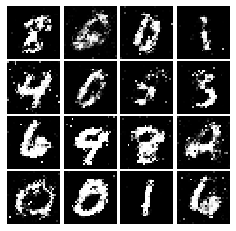

Epoch: 9, Iter: 4560, D: 1.29, G:0.8804


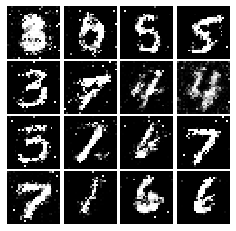

Epoch: 9, Iter: 4580, D: 1.371, G:0.842


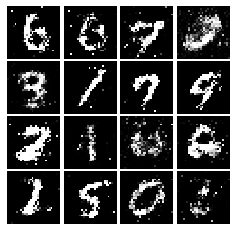

Epoch: 9, Iter: 4600, D: 1.356, G:0.7898


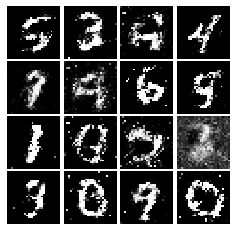

Epoch: 9, Iter: 4620, D: 1.417, G:0.7475


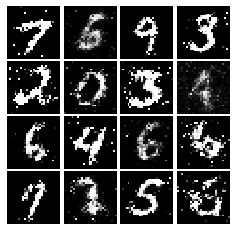

Epoch: 9, Iter: 4640, D: 1.359, G:0.8132


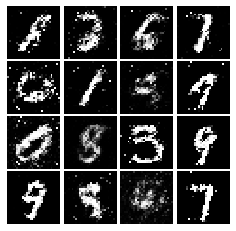

Epoch: 9, Iter: 4660, D: 1.318, G:0.7084


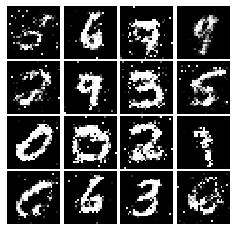

Epoch: 9, Iter: 4680, D: 1.344, G:0.8424


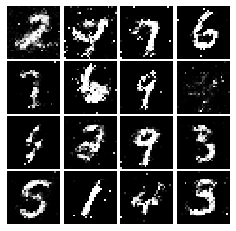

Final images


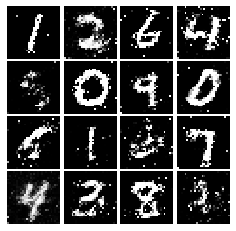

In [0]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [0]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    real_loss = 0.5 * tf.reduce_mean((scores_real - tf.ones_like(scores_real)) ** 2)
    fake_loss = 0.5 * tf.reduce_mean(scores_fake ** 2)

    loss = real_loss + fake_loss

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean((scores_fake - tf.ones_like(scores_fake)) ** 2)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [0]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 2.604, G:0.4097


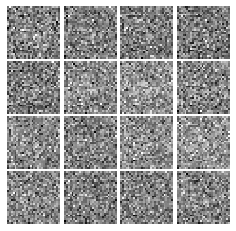

Epoch: 0, Iter: 20, D: 0.06109, G:1.183


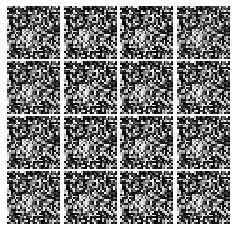

Epoch: 0, Iter: 40, D: 0.01221, G:0.5982


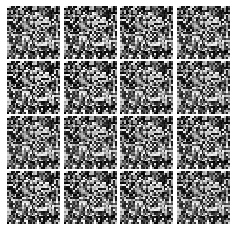

Epoch: 0, Iter: 60, D: 0.08786, G:0.699


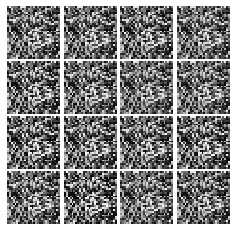

Epoch: 0, Iter: 80, D: 0.01218, G:0.7201


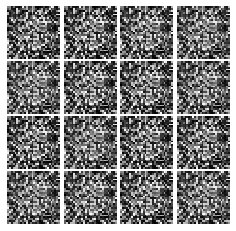

Epoch: 0, Iter: 100, D: 0.006896, G:0.5982


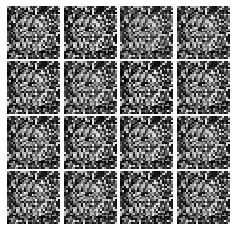

Epoch: 0, Iter: 120, D: 0.01202, G:0.6909


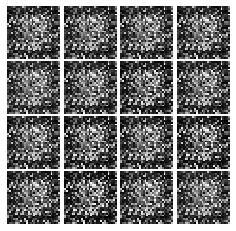

Epoch: 0, Iter: 140, D: 0.01676, G:0.6171


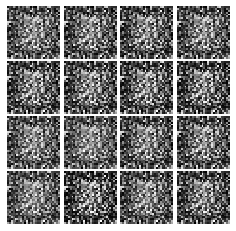

Epoch: 0, Iter: 160, D: 0.3218, G:0.5135


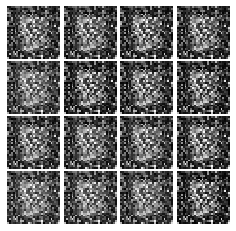

Epoch: 0, Iter: 180, D: 0.1312, G:0.302


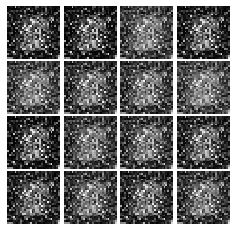

Epoch: 0, Iter: 200, D: 0.1509, G:0.4714


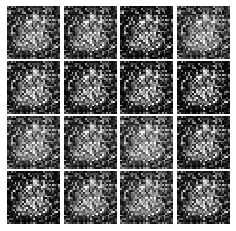

Epoch: 0, Iter: 220, D: 0.149, G:0.5358


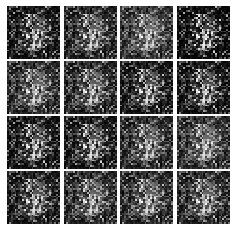

Epoch: 0, Iter: 240, D: 0.1245, G:0.4079


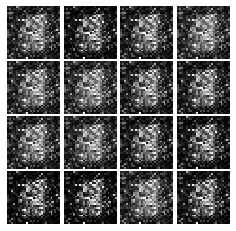

Epoch: 0, Iter: 260, D: 0.4569, G:1.393


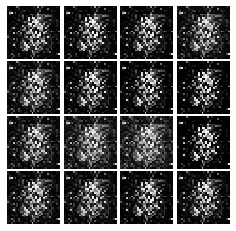

Epoch: 0, Iter: 280, D: 0.109, G:0.4761


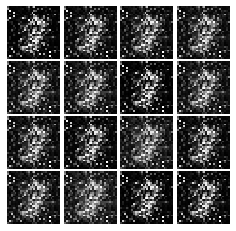

Epoch: 0, Iter: 300, D: 0.03702, G:0.499


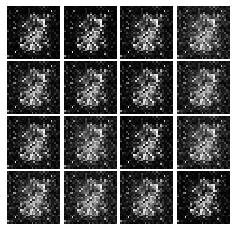

Epoch: 0, Iter: 320, D: 0.1798, G:0.4474


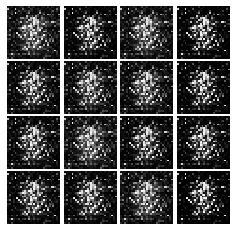

Epoch: 0, Iter: 340, D: 0.1379, G:0.3626


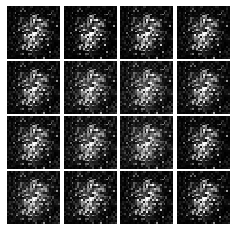

Epoch: 0, Iter: 360, D: 0.1746, G:0.475


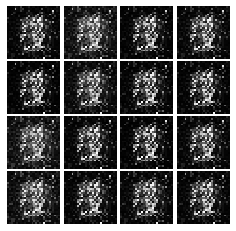

Epoch: 0, Iter: 380, D: 0.05246, G:0.504


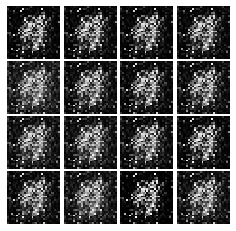

Epoch: 0, Iter: 400, D: 0.1234, G:0.5854


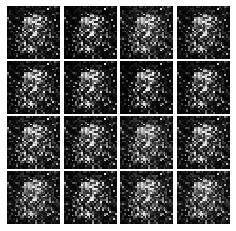

Epoch: 0, Iter: 420, D: 0.2849, G:0.8416


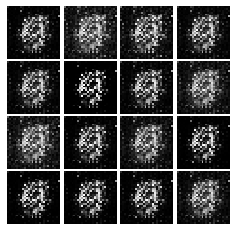

Epoch: 0, Iter: 440, D: 0.2154, G:0.2671


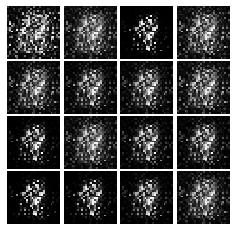

Epoch: 0, Iter: 460, D: 0.1233, G:0.294


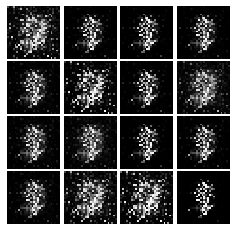

Epoch: 1, Iter: 480, D: 0.09425, G:0.5083


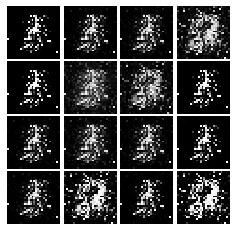

Epoch: 1, Iter: 500, D: 0.1134, G:0.2721


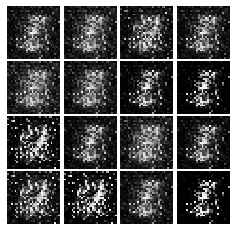

Epoch: 1, Iter: 520, D: 0.1305, G:0.3001


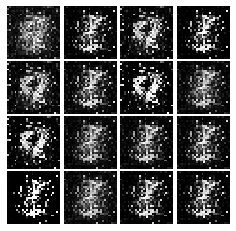

Epoch: 1, Iter: 540, D: 0.05507, G:0.565


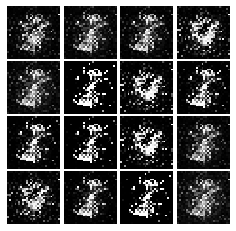

Epoch: 1, Iter: 560, D: 0.1078, G:0.3967


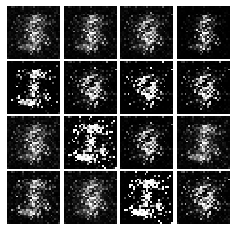

Epoch: 1, Iter: 580, D: 0.129, G:0.7344


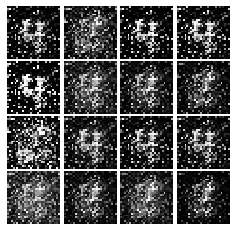

Epoch: 1, Iter: 600, D: 0.1003, G:0.4811


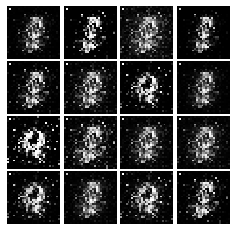

Epoch: 1, Iter: 620, D: 0.1161, G:0.6283


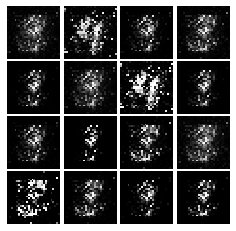

Epoch: 1, Iter: 640, D: 0.1378, G:0.3841


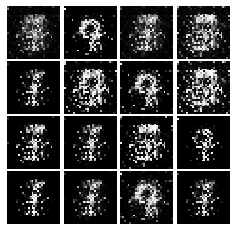

Epoch: 1, Iter: 660, D: 0.173, G:0.6973


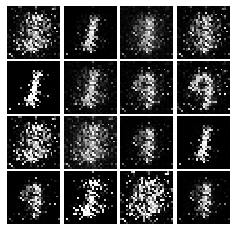

Epoch: 1, Iter: 680, D: 0.1461, G:0.2952


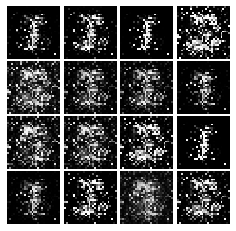

Epoch: 1, Iter: 700, D: 0.1263, G:0.3306


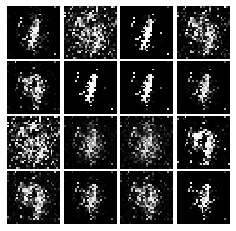

Epoch: 1, Iter: 720, D: 0.1359, G:0.2976


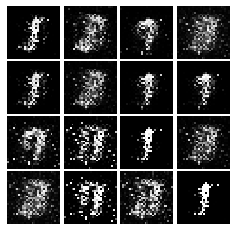

Epoch: 1, Iter: 740, D: 0.1477, G:0.2285


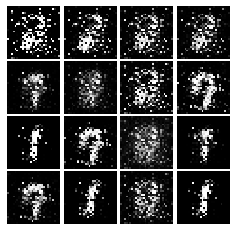

Epoch: 1, Iter: 760, D: 0.08709, G:0.3953


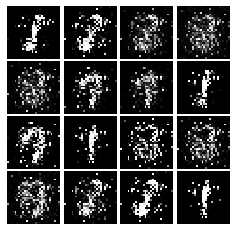

Epoch: 1, Iter: 780, D: 0.2061, G:0.01349


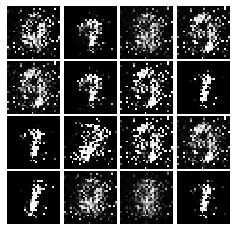

Epoch: 1, Iter: 800, D: 0.09728, G:0.5278


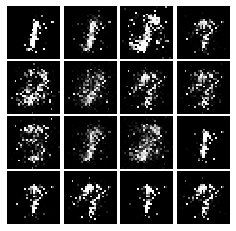

Epoch: 1, Iter: 820, D: 0.09303, G:0.4213


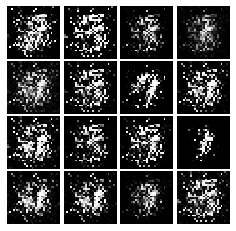

Epoch: 1, Iter: 840, D: 0.1545, G:0.3601


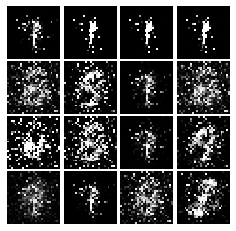

Epoch: 1, Iter: 860, D: 0.08508, G:0.3971


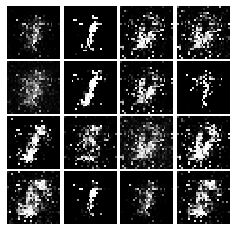

Epoch: 1, Iter: 880, D: 0.1362, G:0.3183


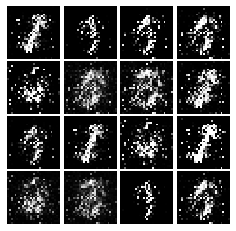

Epoch: 1, Iter: 900, D: 0.1138, G:0.36


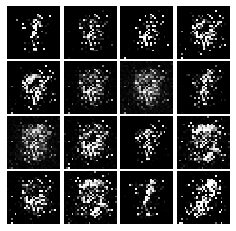

Epoch: 1, Iter: 920, D: 0.1293, G:0.4669


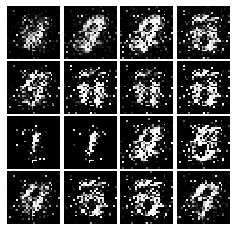

Epoch: 2, Iter: 940, D: 0.1245, G:0.3407


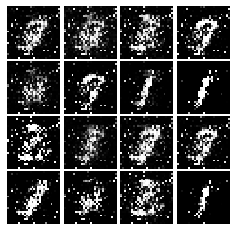

Epoch: 2, Iter: 960, D: 0.1237, G:0.3249


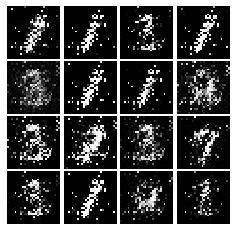

Epoch: 2, Iter: 980, D: 0.1551, G:0.2759


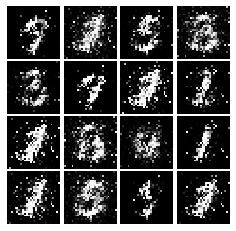

Epoch: 2, Iter: 1000, D: 0.1153, G:0.424


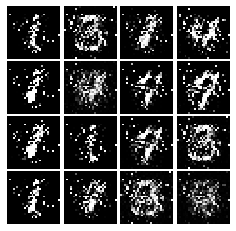

Epoch: 2, Iter: 1020, D: 0.1344, G:0.495


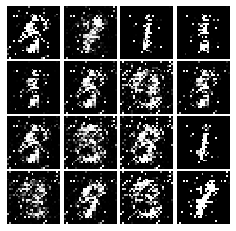

Epoch: 2, Iter: 1040, D: 0.08172, G:0.3219


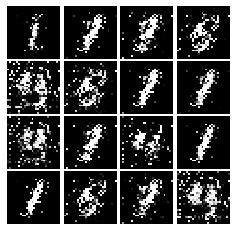

Epoch: 2, Iter: 1060, D: 0.1364, G:0.3149


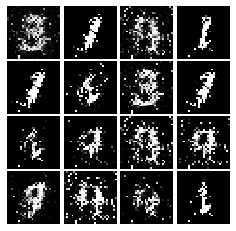

Epoch: 2, Iter: 1080, D: 0.2095, G:0.1852


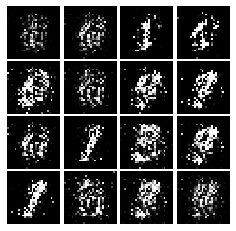

Epoch: 2, Iter: 1100, D: 0.1399, G:0.3517


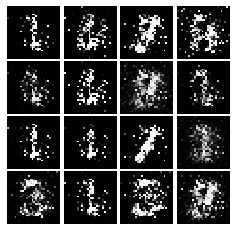

Epoch: 2, Iter: 1120, D: 0.1657, G:0.3158


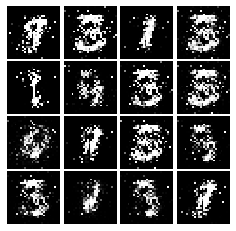

Epoch: 2, Iter: 1140, D: 0.1857, G:0.2351


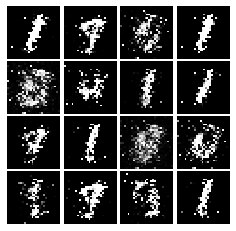

Epoch: 2, Iter: 1160, D: 0.1521, G:0.3152


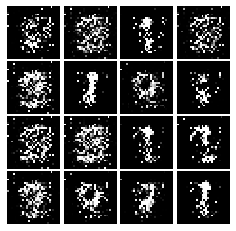

Epoch: 2, Iter: 1180, D: 0.1211, G:0.2828


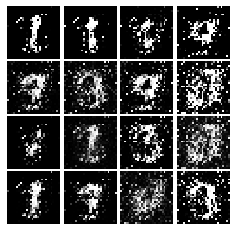

Epoch: 2, Iter: 1200, D: 0.1538, G:0.2826


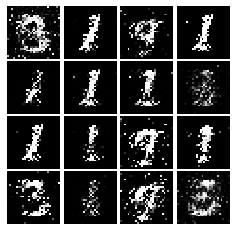

Epoch: 2, Iter: 1220, D: 0.1257, G:0.5439


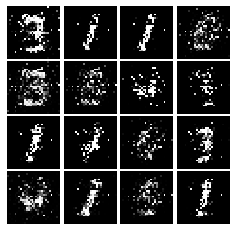

Epoch: 2, Iter: 1240, D: 0.1259, G:0.3829


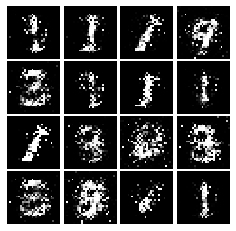

Epoch: 2, Iter: 1260, D: 0.2036, G:0.5086


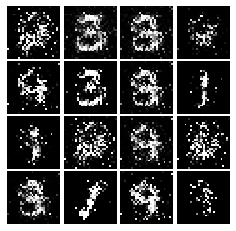

Epoch: 2, Iter: 1280, D: 0.1368, G:0.3268


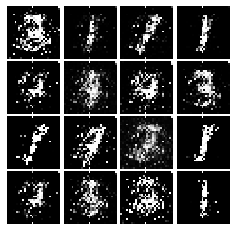

Epoch: 2, Iter: 1300, D: 0.1028, G:0.1597


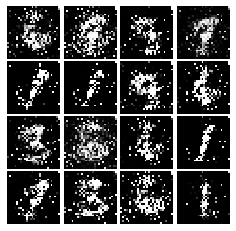

Epoch: 2, Iter: 1320, D: 0.1633, G:0.4518


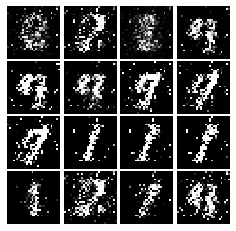

Epoch: 2, Iter: 1340, D: 0.1393, G:0.3123


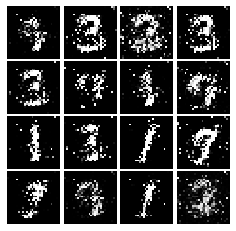

Epoch: 2, Iter: 1360, D: 0.1685, G:0.2513


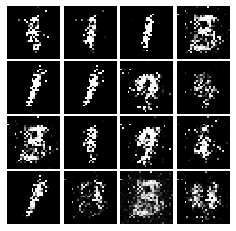

Epoch: 2, Iter: 1380, D: 0.1461, G:0.2861


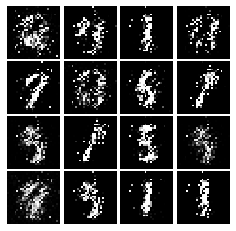

Epoch: 2, Iter: 1400, D: 0.1137, G:0.4695


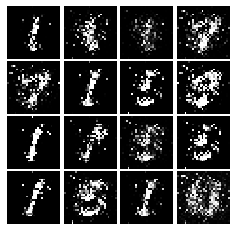

Epoch: 3, Iter: 1420, D: 0.2055, G:0.3095


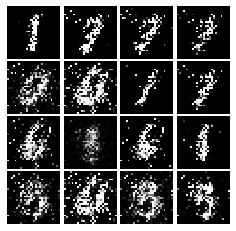

Epoch: 3, Iter: 1440, D: 0.1538, G:0.2579


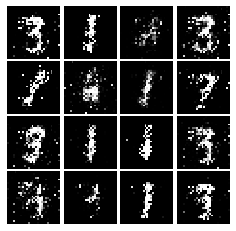

Epoch: 3, Iter: 1460, D: 0.1476, G:0.4545


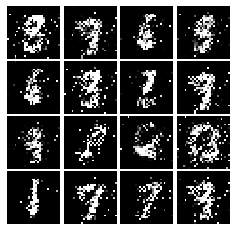

Epoch: 3, Iter: 1480, D: 0.1726, G:0.2885


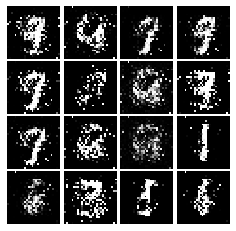

Epoch: 3, Iter: 1500, D: 0.1439, G:0.3036


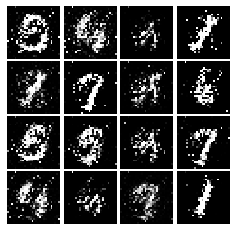

Epoch: 3, Iter: 1520, D: 0.1662, G:0.2664


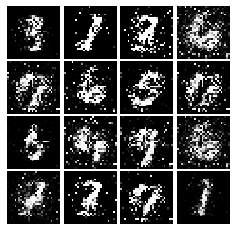

Epoch: 3, Iter: 1540, D: 0.1337, G:0.3126


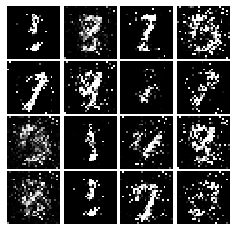

Epoch: 3, Iter: 1560, D: 0.1774, G:0.2609


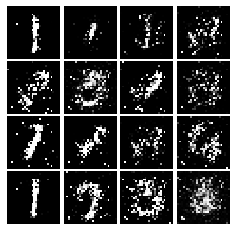

Epoch: 3, Iter: 1580, D: 0.1792, G:0.3065


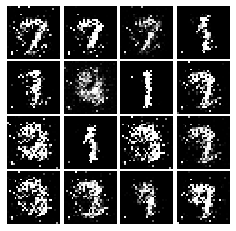

Epoch: 3, Iter: 1600, D: 0.1907, G:0.2959


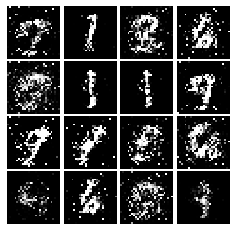

Epoch: 3, Iter: 1620, D: 0.2011, G:0.2152


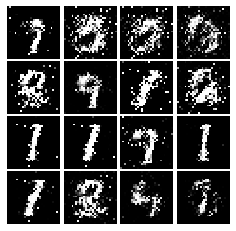

Epoch: 3, Iter: 1640, D: 0.1631, G:0.2879


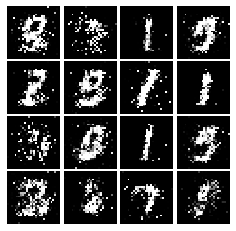

Epoch: 3, Iter: 1660, D: 0.1675, G:0.2324


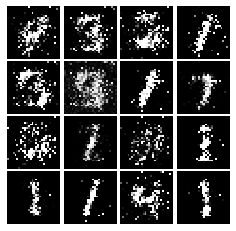

Epoch: 3, Iter: 1680, D: 0.1659, G:0.2747


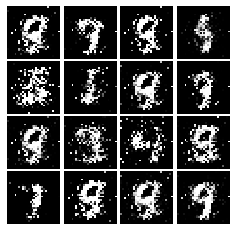

Epoch: 3, Iter: 1700, D: 0.1897, G:0.212


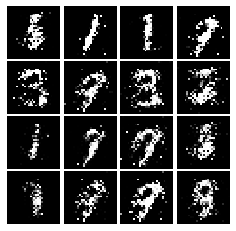

Epoch: 3, Iter: 1720, D: 0.181, G:0.1818


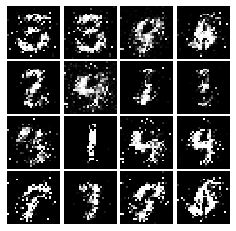

Epoch: 3, Iter: 1740, D: 0.1696, G:0.2206


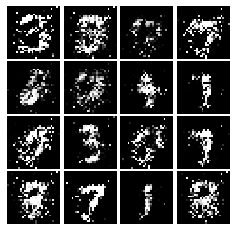

Epoch: 3, Iter: 1760, D: 0.1568, G:0.363


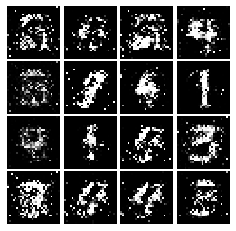

Epoch: 3, Iter: 1780, D: 0.1794, G:0.3075


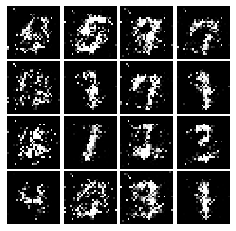

Epoch: 3, Iter: 1800, D: 0.2109, G:0.2257


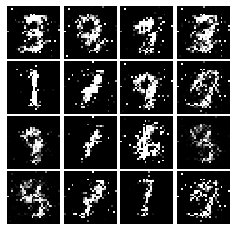

Epoch: 3, Iter: 1820, D: 0.1778, G:0.2426


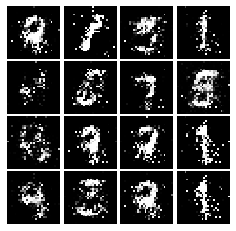

Epoch: 3, Iter: 1840, D: 0.4254, G:0.4237


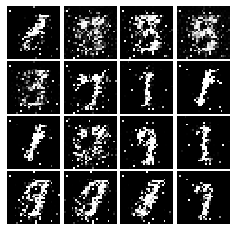

Epoch: 3, Iter: 1860, D: 0.1738, G:0.2446


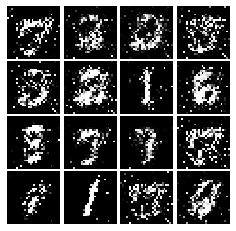

Epoch: 4, Iter: 1880, D: 0.178, G:0.2327


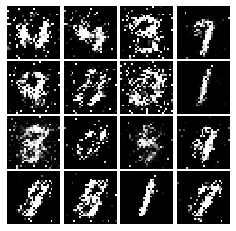

Epoch: 4, Iter: 1900, D: 0.1895, G:0.2462


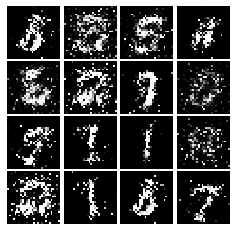

Epoch: 4, Iter: 1920, D: 0.1681, G:0.2464


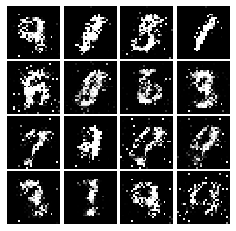

Epoch: 4, Iter: 1940, D: 0.1916, G:0.2822


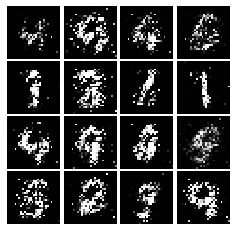

Epoch: 4, Iter: 1960, D: 0.1811, G:0.3069


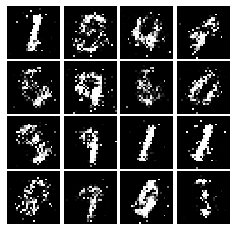

Epoch: 4, Iter: 1980, D: 0.2159, G:0.2237


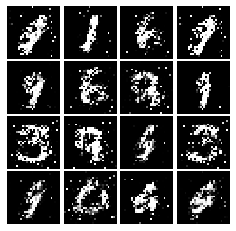

Epoch: 4, Iter: 2000, D: 0.2173, G:0.1852


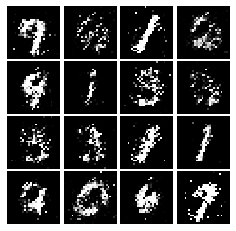

Epoch: 4, Iter: 2020, D: 0.2117, G:0.2174


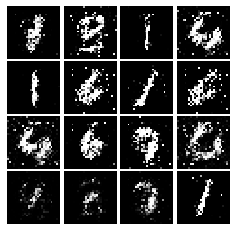

Epoch: 4, Iter: 2040, D: 0.2015, G:0.1664


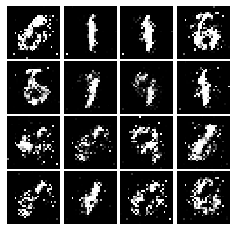

Epoch: 4, Iter: 2060, D: 0.1946, G:0.2193


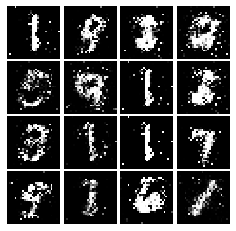

Epoch: 4, Iter: 2080, D: 0.2083, G:0.2068


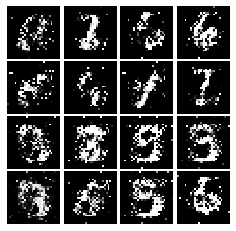

Epoch: 4, Iter: 2100, D: 0.1774, G:0.2625


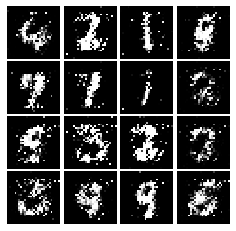

Epoch: 4, Iter: 2120, D: 0.2289, G:0.06133


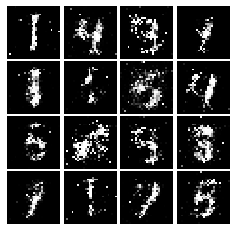

Epoch: 4, Iter: 2140, D: 0.2153, G:0.176


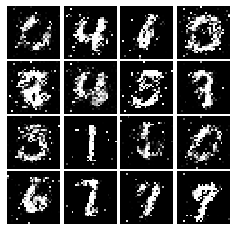

Epoch: 4, Iter: 2160, D: 0.218, G:0.1762


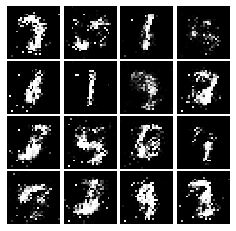

Epoch: 4, Iter: 2180, D: 0.1911, G:0.2122


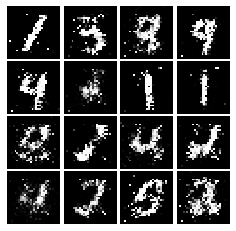

Epoch: 4, Iter: 2200, D: 0.1978, G:0.2691


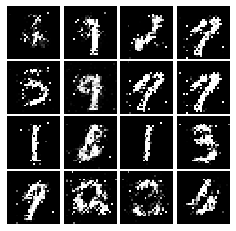

Epoch: 4, Iter: 2220, D: 0.1993, G:0.2608


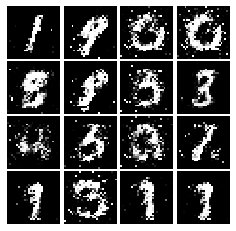

Epoch: 4, Iter: 2240, D: 0.2136, G:0.2405


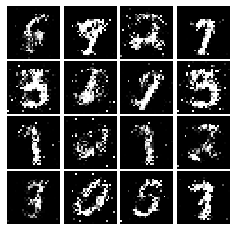

Epoch: 4, Iter: 2260, D: 0.2109, G:0.2265


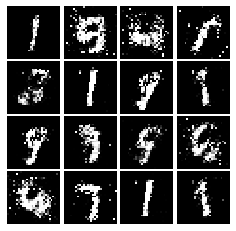

Epoch: 4, Iter: 2280, D: 0.2396, G:0.1995


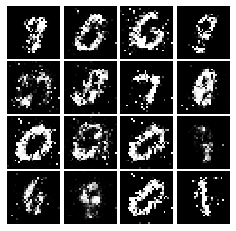

Epoch: 4, Iter: 2300, D: 0.212, G:0.1838


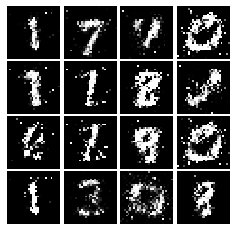

Epoch: 4, Iter: 2320, D: 0.2006, G:0.1813


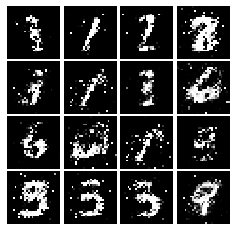

Epoch: 4, Iter: 2340, D: 0.1999, G:0.1774


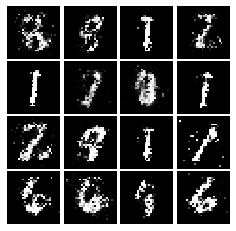

Epoch: 5, Iter: 2360, D: 0.1931, G:0.2373


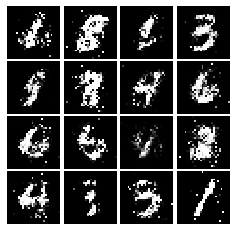

Epoch: 5, Iter: 2380, D: 0.2211, G:0.1813


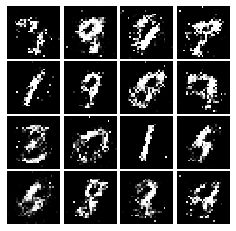

Epoch: 5, Iter: 2400, D: 0.2414, G:0.188


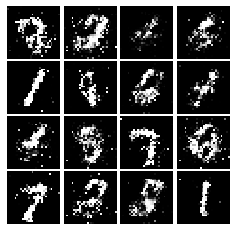

Epoch: 5, Iter: 2420, D: 0.224, G:0.1744


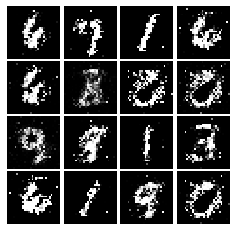

Epoch: 5, Iter: 2440, D: 0.2229, G:0.2155


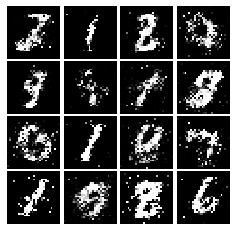

Epoch: 5, Iter: 2460, D: 0.2069, G:0.1976


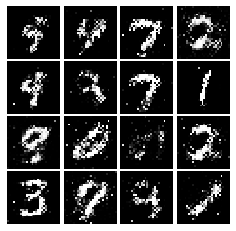

Epoch: 5, Iter: 2480, D: 0.23, G:0.1881


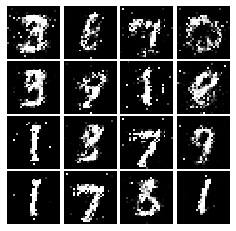

Epoch: 5, Iter: 2500, D: 0.1982, G:0.1909


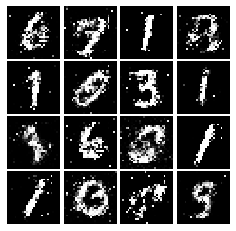

Epoch: 5, Iter: 2520, D: 0.2437, G:0.1755


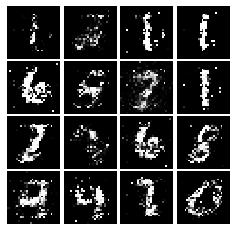

Epoch: 5, Iter: 2540, D: 0.2196, G:0.1916


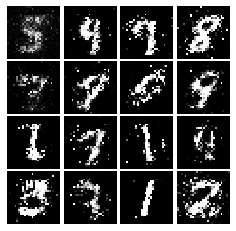

Epoch: 5, Iter: 2560, D: 0.2135, G:0.1981


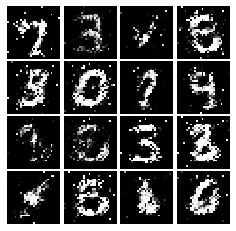

Epoch: 5, Iter: 2580, D: 0.2022, G:0.1956


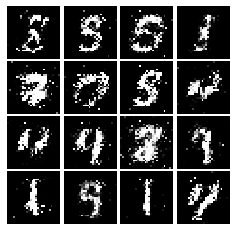

Epoch: 5, Iter: 2600, D: 0.2512, G:0.1508


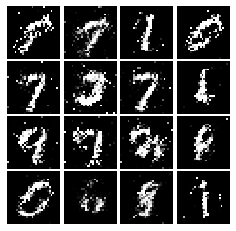

Epoch: 5, Iter: 2620, D: 0.207, G:0.2004


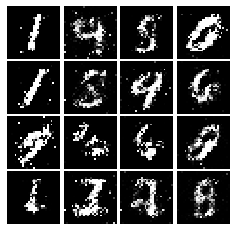

Epoch: 5, Iter: 2640, D: 0.2276, G:0.1858


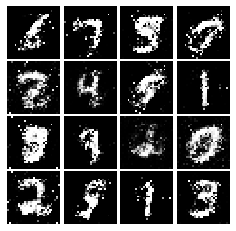

Epoch: 5, Iter: 2660, D: 0.2147, G:0.1764


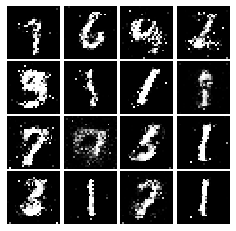

Epoch: 5, Iter: 2680, D: 0.2575, G:0.1485


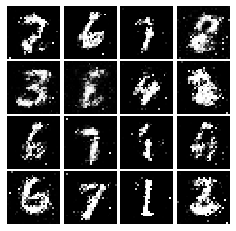

Epoch: 5, Iter: 2700, D: 0.2369, G:0.195


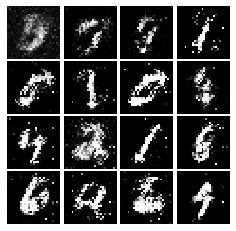

Epoch: 5, Iter: 2720, D: 0.2097, G:0.169


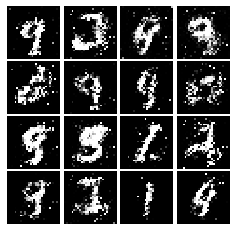

Epoch: 5, Iter: 2740, D: 0.1978, G:0.1719


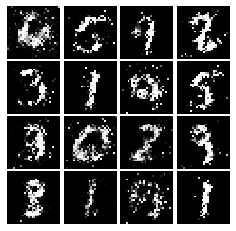

Epoch: 5, Iter: 2760, D: 0.2444, G:0.1753


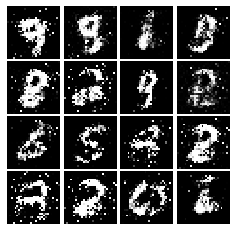

Epoch: 5, Iter: 2780, D: 0.2144, G:0.1693


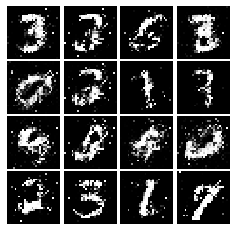

Epoch: 5, Iter: 2800, D: 0.1741, G:0.2163


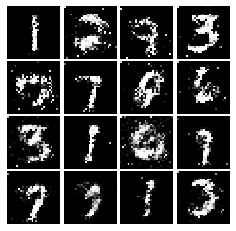

Epoch: 6, Iter: 2820, D: 0.24, G:0.1731


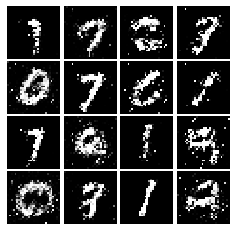

Epoch: 6, Iter: 2840, D: 0.2009, G:0.175


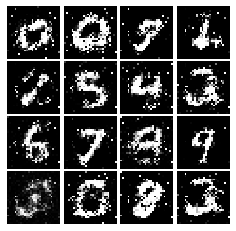

Epoch: 6, Iter: 2860, D: 0.2176, G:0.2459


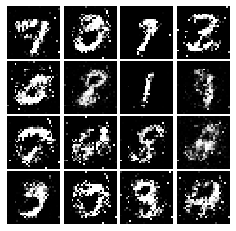

Epoch: 6, Iter: 2880, D: 0.2145, G:0.1948


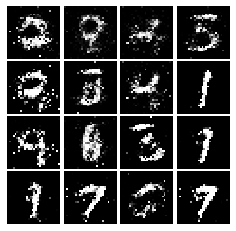

Epoch: 6, Iter: 2900, D: 0.213, G:0.2005


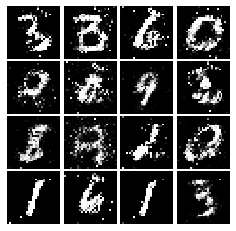

Epoch: 6, Iter: 2920, D: 0.2311, G:0.2028


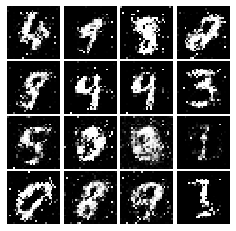

Epoch: 6, Iter: 2940, D: 0.2158, G:0.1533


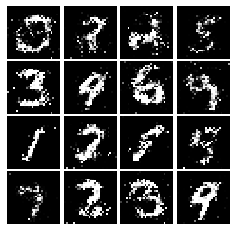

Epoch: 6, Iter: 2960, D: 0.1978, G:0.1691


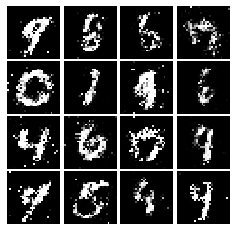

Epoch: 6, Iter: 2980, D: 0.2394, G:0.1874


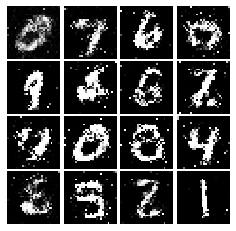

Epoch: 6, Iter: 3000, D: 0.2278, G:0.1992


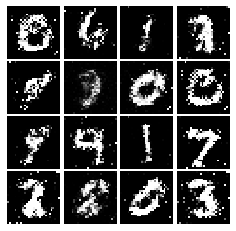

Epoch: 6, Iter: 3020, D: 0.2382, G:0.1765


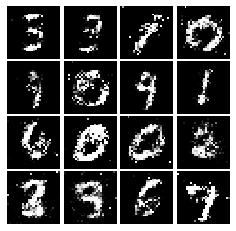

Epoch: 6, Iter: 3040, D: 0.2184, G:0.1859


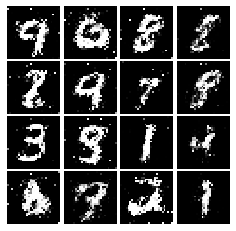

Epoch: 6, Iter: 3060, D: 0.217, G:0.1616


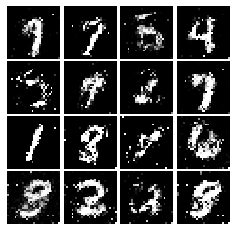

Epoch: 6, Iter: 3080, D: 0.204, G:0.2234


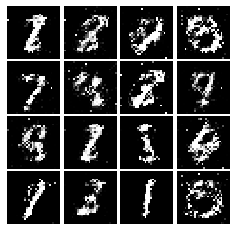

Epoch: 6, Iter: 3100, D: 0.2228, G:0.1808


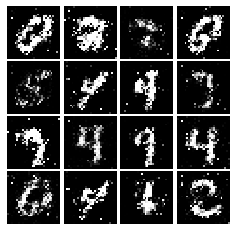

Epoch: 6, Iter: 3120, D: 0.2228, G:0.1817


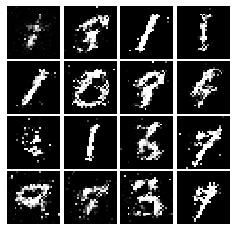

Epoch: 6, Iter: 3140, D: 0.2534, G:0.2117


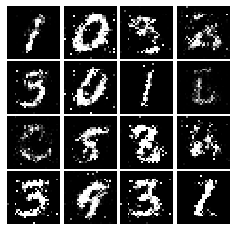

Epoch: 6, Iter: 3160, D: 0.2065, G:0.2044


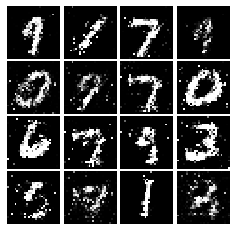

Epoch: 6, Iter: 3180, D: 0.2424, G:0.2065


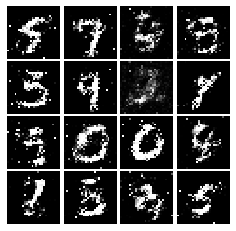

Epoch: 6, Iter: 3200, D: 0.2276, G:0.1882


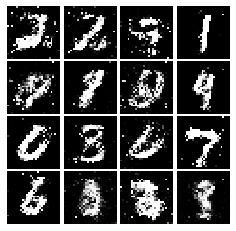

Epoch: 6, Iter: 3220, D: 0.2546, G:0.1709


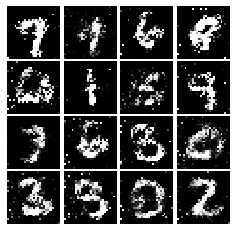

Epoch: 6, Iter: 3240, D: 0.2011, G:0.1791


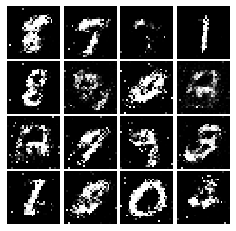

Epoch: 6, Iter: 3260, D: 0.2198, G:0.1868


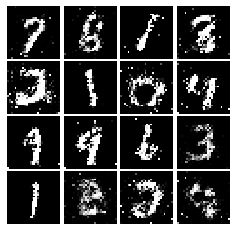

Epoch: 6, Iter: 3280, D: 0.208, G:0.1609


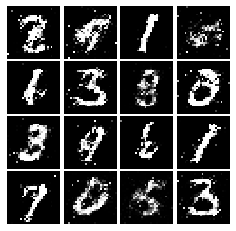

Epoch: 7, Iter: 3300, D: 0.198, G:0.1921


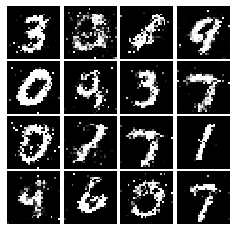

Epoch: 7, Iter: 3320, D: 0.2281, G:0.1781


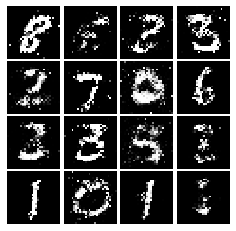

Epoch: 7, Iter: 3340, D: 0.2341, G:0.166


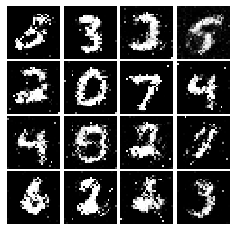

Epoch: 7, Iter: 3360, D: 0.2917, G:0.1692


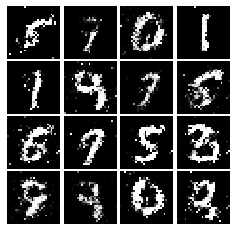

Epoch: 7, Iter: 3380, D: 0.2242, G:0.2056


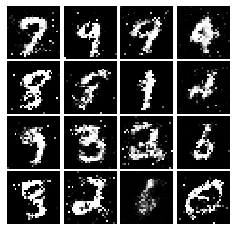

Epoch: 7, Iter: 3400, D: 0.2345, G:0.179


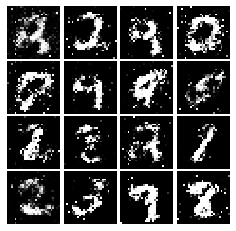

Epoch: 7, Iter: 3420, D: 0.2258, G:0.1712


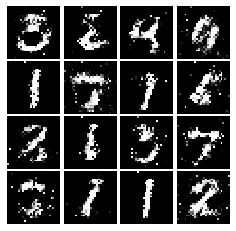

Epoch: 7, Iter: 3440, D: 0.2273, G:0.1934


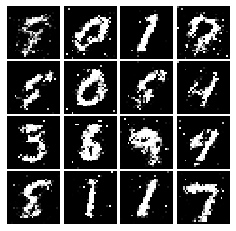

Epoch: 7, Iter: 3460, D: 0.2204, G:0.1656


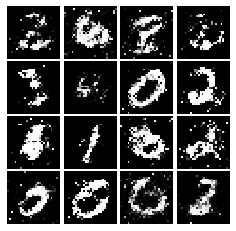

Epoch: 7, Iter: 3480, D: 0.2302, G:0.1721


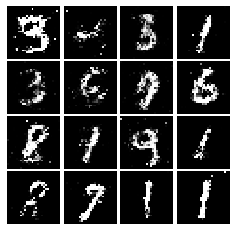

Epoch: 7, Iter: 3500, D: 0.2166, G:0.1591


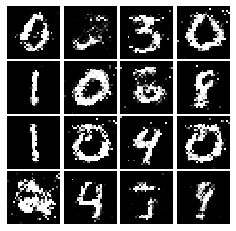

Epoch: 7, Iter: 3520, D: 0.2225, G:0.1754


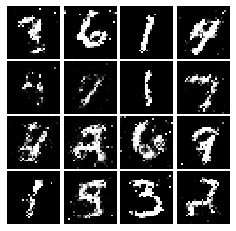

Epoch: 7, Iter: 3540, D: 0.2061, G:0.2009


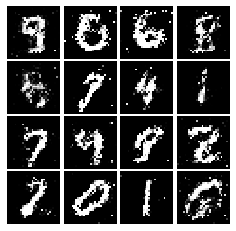

Epoch: 7, Iter: 3560, D: 0.2254, G:0.1901


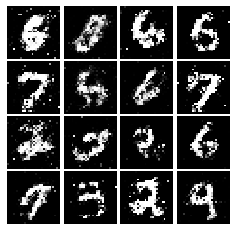

Epoch: 7, Iter: 3580, D: 0.2184, G:0.1663


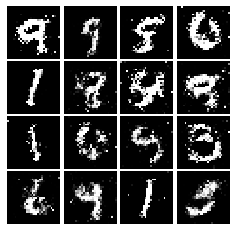

Epoch: 7, Iter: 3600, D: 0.2381, G:0.18


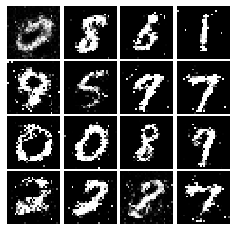

Epoch: 7, Iter: 3620, D: 0.2096, G:0.1681


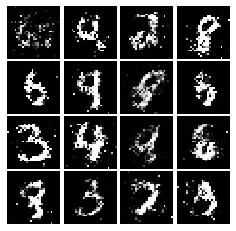

Epoch: 7, Iter: 3640, D: 0.2257, G:0.1725


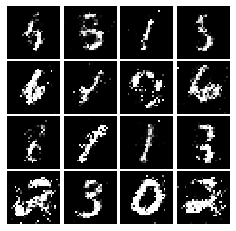

Epoch: 7, Iter: 3660, D: 0.2163, G:0.1744


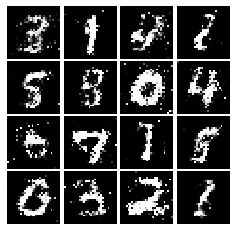

Epoch: 7, Iter: 3680, D: 0.2228, G:0.1898


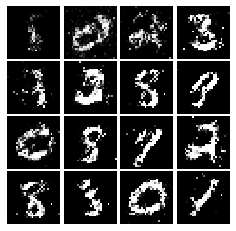

Epoch: 7, Iter: 3700, D: 0.2375, G:0.1976


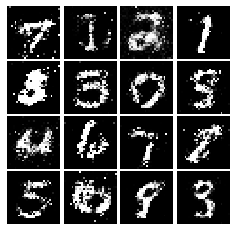

Epoch: 7, Iter: 3720, D: 0.2184, G:0.1767


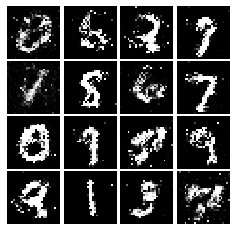

Epoch: 7, Iter: 3740, D: 0.2157, G:0.198


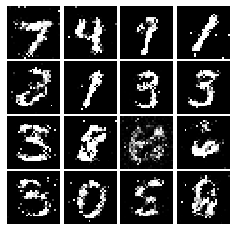

Epoch: 8, Iter: 3760, D: 0.2405, G:0.1966


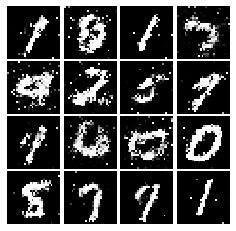

Epoch: 8, Iter: 3780, D: 0.222, G:0.1711


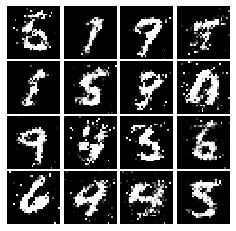

Epoch: 8, Iter: 3800, D: 0.2417, G:0.1799


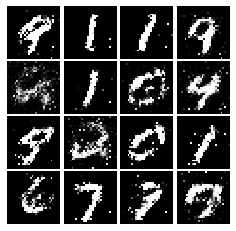

Epoch: 8, Iter: 3820, D: 0.2492, G:0.1764


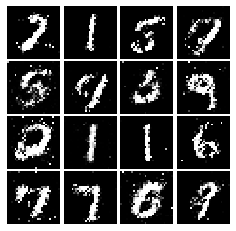

Epoch: 8, Iter: 3840, D: 0.2354, G:0.1596


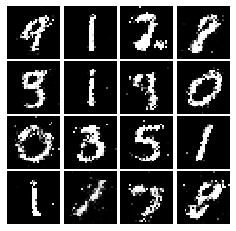

Epoch: 8, Iter: 3860, D: 0.2044, G:0.1566


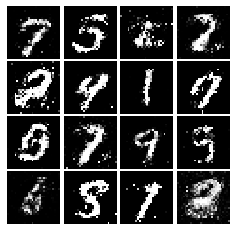

Epoch: 8, Iter: 3880, D: 0.2158, G:0.1662


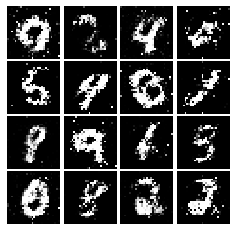

Epoch: 8, Iter: 3900, D: 0.2359, G:0.1705


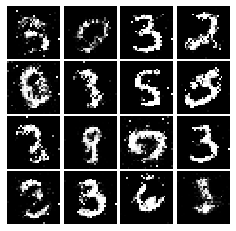

Epoch: 8, Iter: 3920, D: 0.2314, G:0.1466


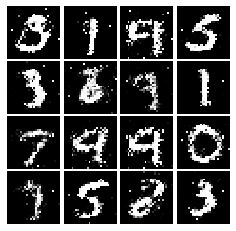

Epoch: 8, Iter: 3940, D: 0.2382, G:0.1653


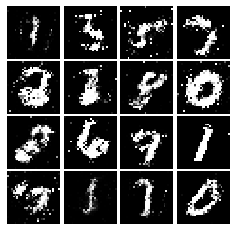

Epoch: 8, Iter: 3960, D: 0.2415, G:0.1479


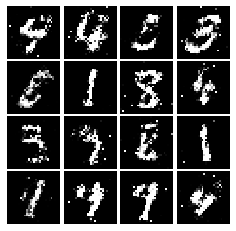

Epoch: 8, Iter: 3980, D: 0.2197, G:0.1809


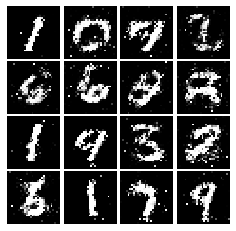

Epoch: 8, Iter: 4000, D: 0.2081, G:0.1945


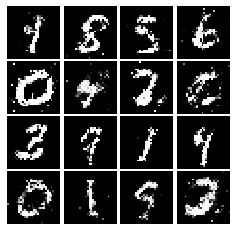

Epoch: 8, Iter: 4020, D: 0.2475, G:0.1645


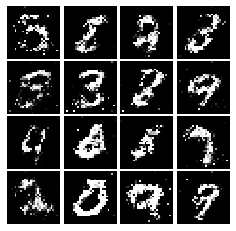

Epoch: 8, Iter: 4040, D: 0.2254, G:0.1576


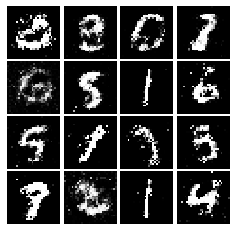

Epoch: 8, Iter: 4060, D: 0.2504, G:0.1386


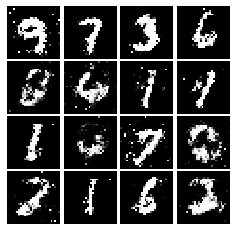

Epoch: 8, Iter: 4080, D: 0.2226, G:0.1628


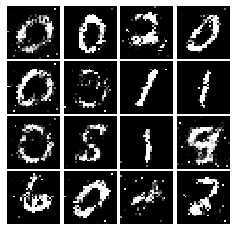

Epoch: 8, Iter: 4100, D: 0.2283, G:0.1899


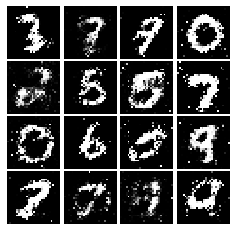

Epoch: 8, Iter: 4120, D: 0.2234, G:0.1706


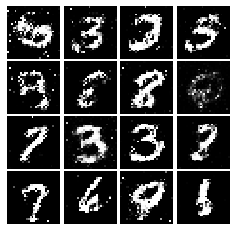

Epoch: 8, Iter: 4140, D: 0.2208, G:0.1579


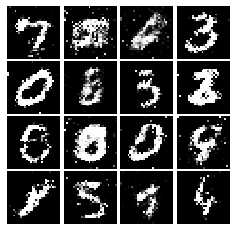

Epoch: 8, Iter: 4160, D: 0.2453, G:0.1457


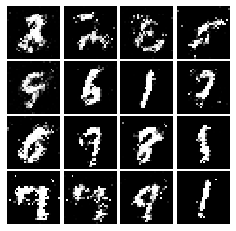

Epoch: 8, Iter: 4180, D: 0.2263, G:0.1569


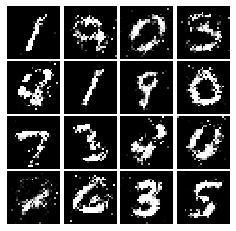

Epoch: 8, Iter: 4200, D: 0.2003, G:0.1769


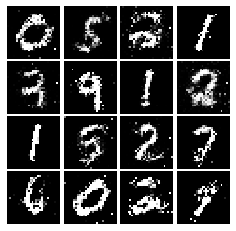

Epoch: 8, Iter: 4220, D: 0.2194, G:0.1924


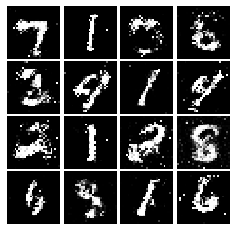

Epoch: 9, Iter: 4240, D: 0.2358, G:0.1554


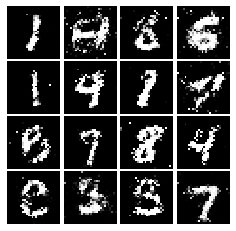

Epoch: 9, Iter: 4260, D: 0.23, G:0.1744


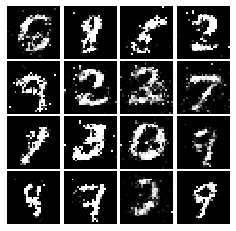

Epoch: 9, Iter: 4280, D: 0.2408, G:0.1669


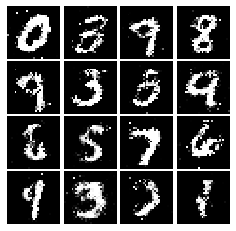

Epoch: 9, Iter: 4300, D: 0.2306, G:0.1661


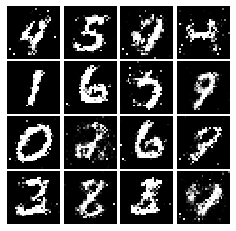

Epoch: 9, Iter: 4320, D: 0.2296, G:0.1737


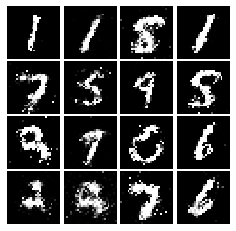

Epoch: 9, Iter: 4340, D: 0.2444, G:0.1695


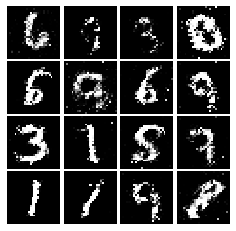

Epoch: 9, Iter: 4360, D: 0.2315, G:0.1846


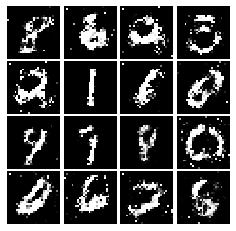

Epoch: 9, Iter: 4380, D: 0.2255, G:0.1346


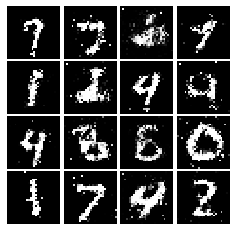

Epoch: 9, Iter: 4400, D: 0.1993, G:0.2029


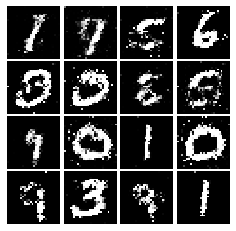

Epoch: 9, Iter: 4420, D: 0.2391, G:0.1583


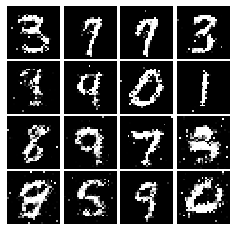

Epoch: 9, Iter: 4440, D: 0.2198, G:0.1641


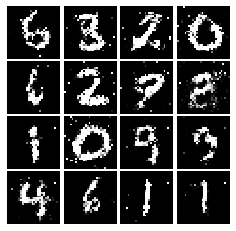

Epoch: 9, Iter: 4460, D: 0.2337, G:0.186


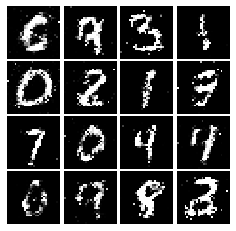

Epoch: 9, Iter: 4480, D: 0.2182, G:0.1634


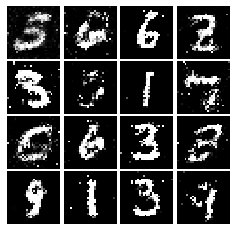

Epoch: 9, Iter: 4500, D: 0.2692, G:0.1607


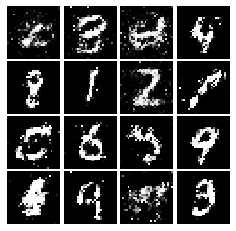

Epoch: 9, Iter: 4520, D: 0.2182, G:0.1786


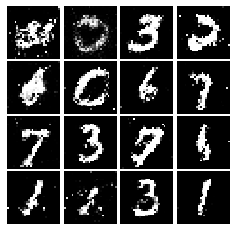

Epoch: 9, Iter: 4540, D: 0.2351, G:0.1734


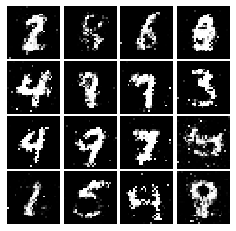

Epoch: 9, Iter: 4560, D: 0.2262, G:0.1771


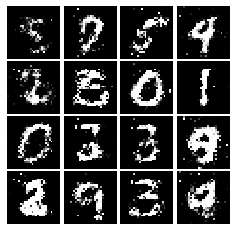

Epoch: 9, Iter: 4580, D: 0.2389, G:0.1717


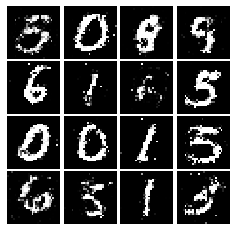

Epoch: 9, Iter: 4600, D: 0.2373, G:0.1534


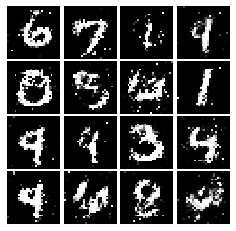

Epoch: 9, Iter: 4620, D: 0.2142, G:0.1689


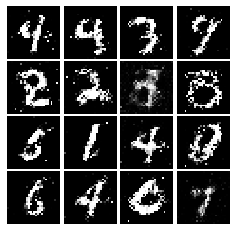

Epoch: 9, Iter: 4640, D: 0.2355, G:0.1581


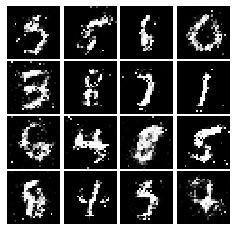

Epoch: 9, Iter: 4660, D: 0.2362, G:0.1743


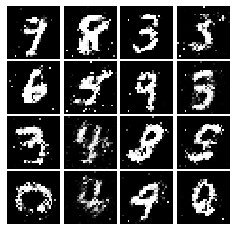

Epoch: 9, Iter: 4680, D: 0.2376, G:0.1726


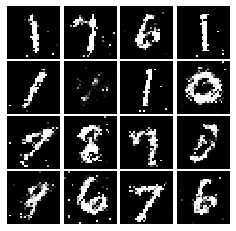

Final images


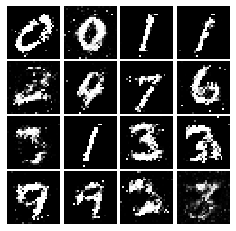

In [0]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [0]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Reshape((28, 28, 1), input_shape=(784, )),
        tf.keras.layers.Conv2D(filters=32, kernel_size=(5, 5), strides=(1, 1), padding='valid'),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPool2D(pool_size=(2, 2), strides=(2, 2)),
        tf.keras.layers.Conv2D(filters=64, kernel_size=(5, 5), strides=(1, 1), padding='valid'),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPool2D(pool_size=(2, 2), strides=(2, 2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [0]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(1024, use_bias=True, input_shape=(noise_dim, ), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(7*7*128, use_bias=True, activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Reshape((7, 7, 128)),
        tf.keras.layers.Conv2DTranspose(filters=64, kernel_size=(4, 4), strides=(2, 2), padding='same', activation='relu', use_bias=True),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2DTranspose(filters=1, kernel_size=(4, 4), strides=(2, 2), padding='same', activation='tanh', use_bias=True)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.44, G:0.6537


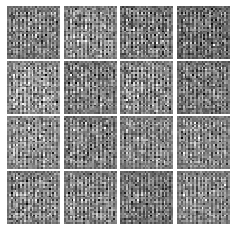

Epoch: 0, Iter: 20, D: 0.3089, G:1.906


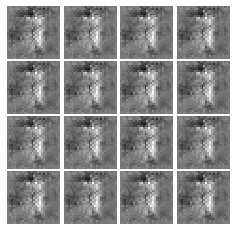

Epoch: 0, Iter: 40, D: 0.5342, G:1.42


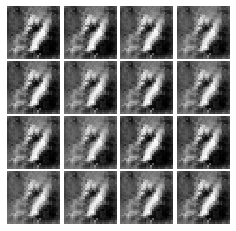

Epoch: 0, Iter: 60, D: 0.4089, G:1.931


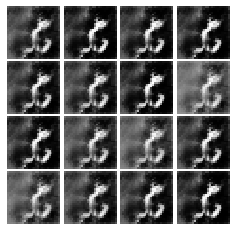

Epoch: 0, Iter: 80, D: 0.3879, G:4.032


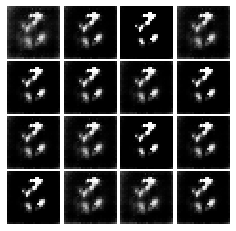

Epoch: 0, Iter: 100, D: 1.154, G:3.269


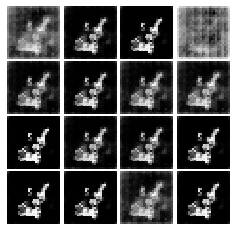

Epoch: 0, Iter: 120, D: 0.9034, G:5.474


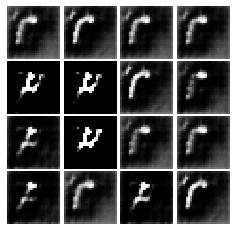

Epoch: 0, Iter: 140, D: 0.3659, G:2.593


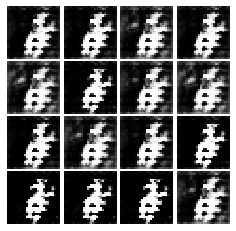

Epoch: 0, Iter: 160, D: 0.3975, G:4.018


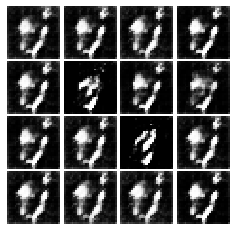

Epoch: 0, Iter: 180, D: 0.7117, G:1.923


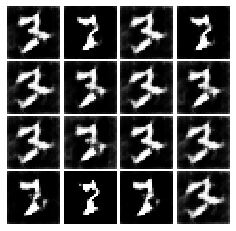

Epoch: 0, Iter: 200, D: 0.4601, G:2.096


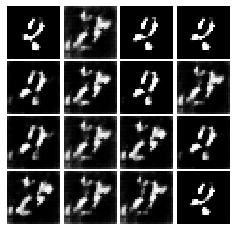

Epoch: 0, Iter: 220, D: 0.8576, G:2.004


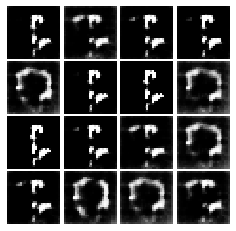

Epoch: 0, Iter: 240, D: 0.5086, G:2.323


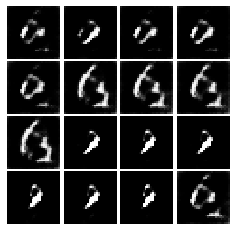

Epoch: 0, Iter: 260, D: 0.9686, G:1.066


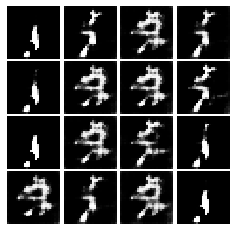

Epoch: 0, Iter: 280, D: 1.444, G:4.708


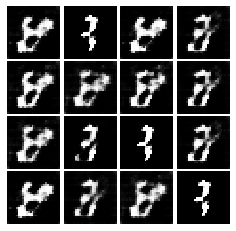

Epoch: 0, Iter: 300, D: 0.5168, G:2.893


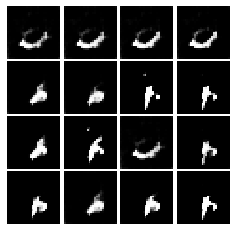

Epoch: 0, Iter: 320, D: 0.8165, G:2.528


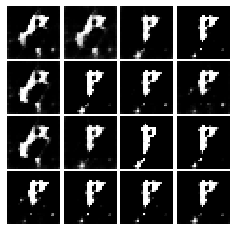

Epoch: 0, Iter: 340, D: 0.506, G:2.828


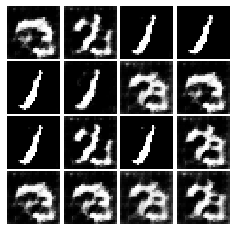

Epoch: 0, Iter: 360, D: 0.792, G:3.466


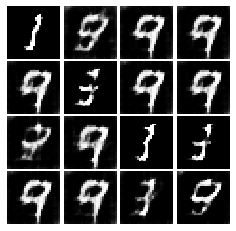

Epoch: 0, Iter: 380, D: 0.391, G:3.17


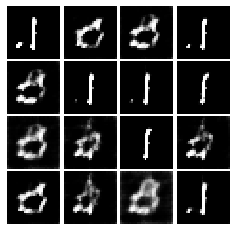

Epoch: 0, Iter: 400, D: 0.5002, G:3.073


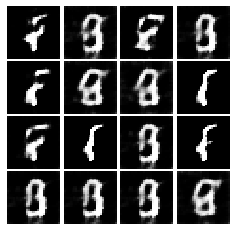

Epoch: 0, Iter: 420, D: 0.8819, G:1.508


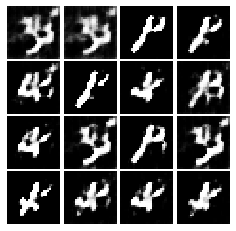

Epoch: 0, Iter: 440, D: 0.7229, G:2.106


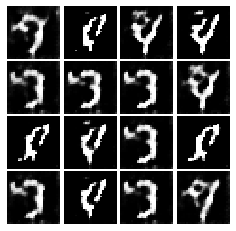

Epoch: 0, Iter: 460, D: 0.3035, G:2.982


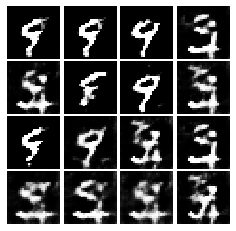

Epoch: 1, Iter: 480, D: 0.9001, G:7.312


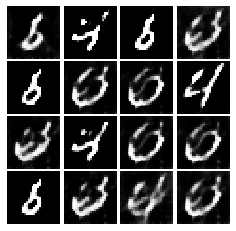

Epoch: 1, Iter: 500, D: 0.3868, G:3.368


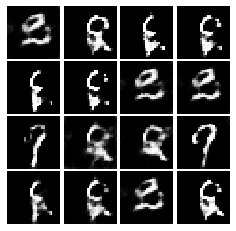

Epoch: 1, Iter: 520, D: 0.9994, G:3.259


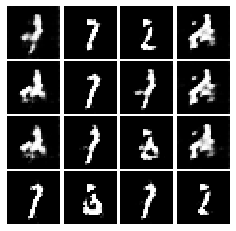

Epoch: 1, Iter: 540, D: 0.8082, G:3.861


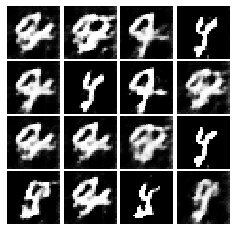

Epoch: 1, Iter: 560, D: 0.3587, G:2.579


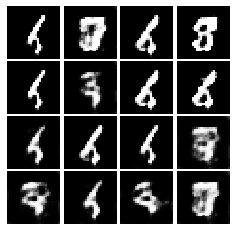

Epoch: 1, Iter: 580, D: 0.3259, G:3.373


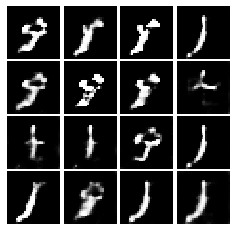

Epoch: 1, Iter: 600, D: 0.3729, G:4.051


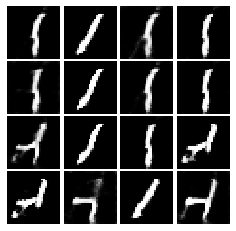

Epoch: 1, Iter: 620, D: 0.7892, G:1.827


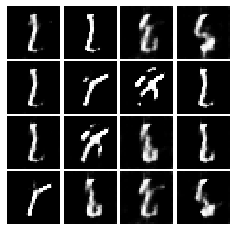

Epoch: 1, Iter: 640, D: 0.605, G:2.991


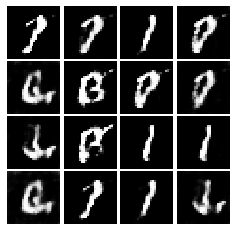

Epoch: 1, Iter: 660, D: 0.2753, G:2.663


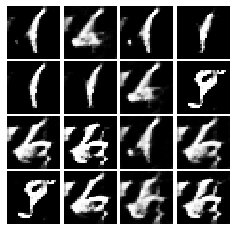

Epoch: 1, Iter: 680, D: 0.454, G:3.395


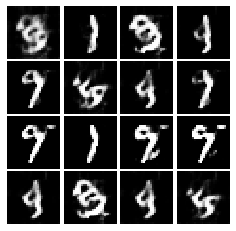

Epoch: 1, Iter: 700, D: 0.4033, G:3.402


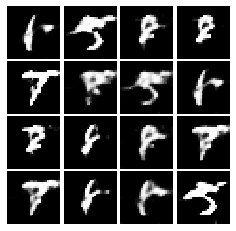

Epoch: 1, Iter: 720, D: 0.8675, G:7.329


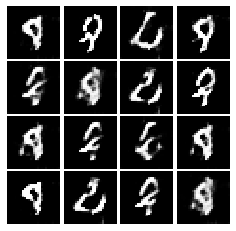

Epoch: 1, Iter: 740, D: 0.4677, G:2.41


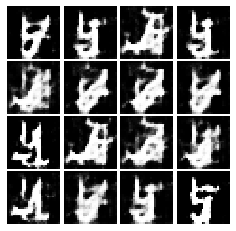

Epoch: 1, Iter: 760, D: 1.067, G:6.966


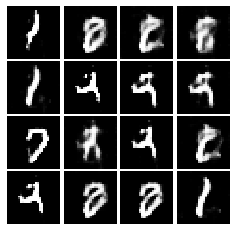

Epoch: 1, Iter: 780, D: 0.5444, G:3.924


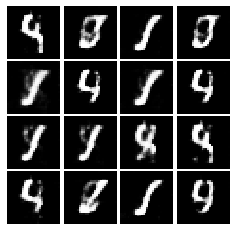

Epoch: 1, Iter: 800, D: 0.4612, G:2.613


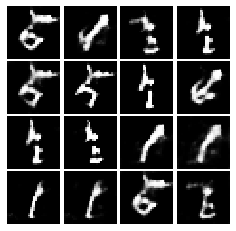

Epoch: 1, Iter: 820, D: 0.2872, G:4.443


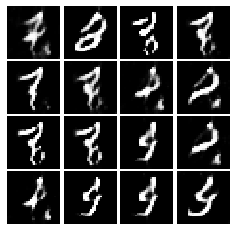

Epoch: 1, Iter: 840, D: 0.5335, G:3.327


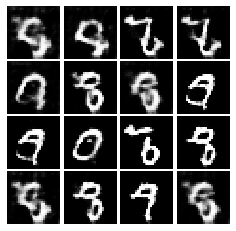

Epoch: 1, Iter: 860, D: 0.4836, G:2.705


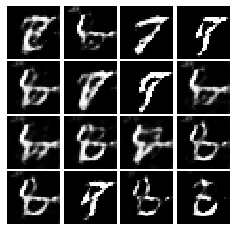

Epoch: 1, Iter: 880, D: 0.6035, G:2.774


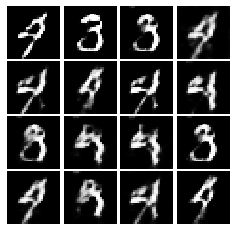

Epoch: 1, Iter: 900, D: 0.3429, G:3.288


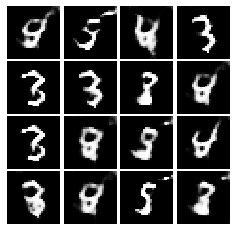

Epoch: 1, Iter: 920, D: 0.4431, G:4.389


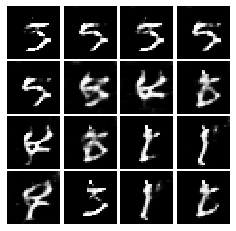

Epoch: 2, Iter: 940, D: 0.5623, G:1.603


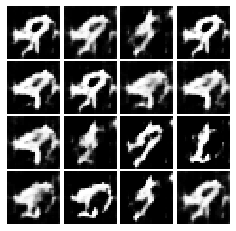

Epoch: 2, Iter: 960, D: 0.2038, G:3.429


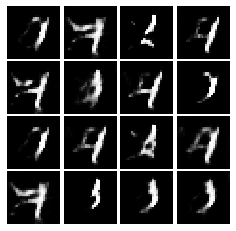

Epoch: 2, Iter: 980, D: 0.379, G:3.011


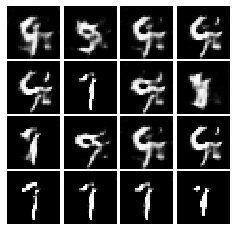

Epoch: 2, Iter: 1000, D: 0.5468, G:5.732


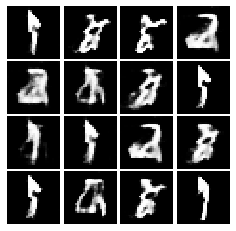

Epoch: 2, Iter: 1020, D: 0.6539, G:4.348


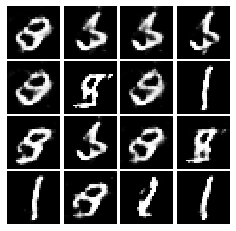

Epoch: 2, Iter: 1040, D: 0.525, G:2.379


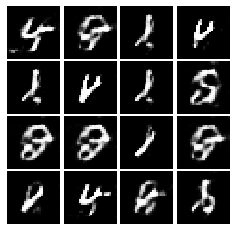

Epoch: 2, Iter: 1060, D: 0.4859, G:3.789


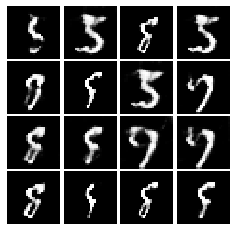

Epoch: 2, Iter: 1080, D: 0.3236, G:3.573


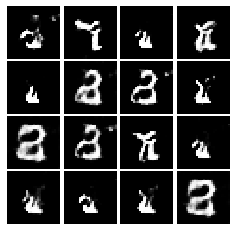

Epoch: 2, Iter: 1100, D: 0.4511, G:4.855


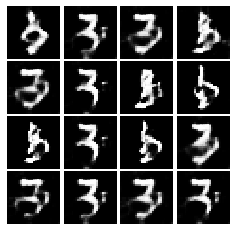

Epoch: 2, Iter: 1120, D: 0.31, G:4.73


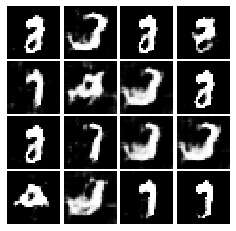

Epoch: 2, Iter: 1140, D: 0.2563, G:4.185


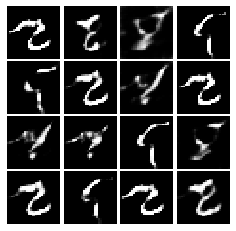

Epoch: 2, Iter: 1160, D: 0.5805, G:3.171


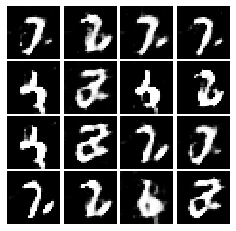

Epoch: 2, Iter: 1180, D: 0.3512, G:3.121


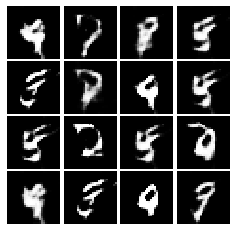

Epoch: 2, Iter: 1200, D: 0.3776, G:4.106


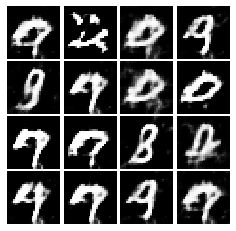

Epoch: 2, Iter: 1220, D: 0.4378, G:3.853


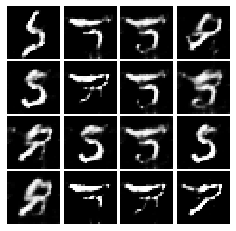

Epoch: 2, Iter: 1240, D: 0.5957, G:3.601


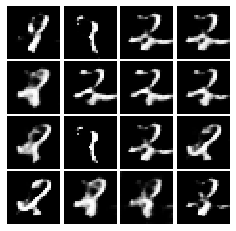

Epoch: 2, Iter: 1260, D: 0.6603, G:2.021


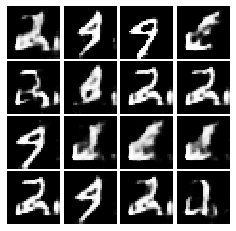

Epoch: 2, Iter: 1280, D: 0.2398, G:3.208


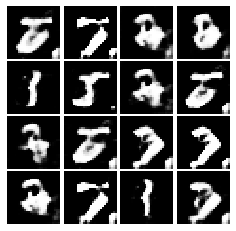

Epoch: 2, Iter: 1300, D: 0.3216, G:3.07


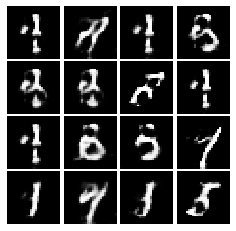

Epoch: 2, Iter: 1320, D: 0.5154, G:2.113


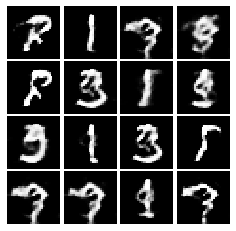

Epoch: 2, Iter: 1340, D: 0.2827, G:3.037


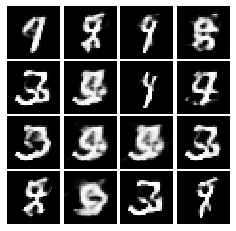

Epoch: 2, Iter: 1360, D: 0.3245, G:3.636


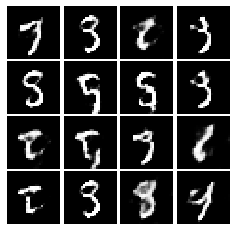

Epoch: 2, Iter: 1380, D: 0.2423, G:3.438


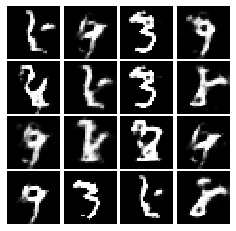

Epoch: 2, Iter: 1400, D: 0.4595, G:2.002


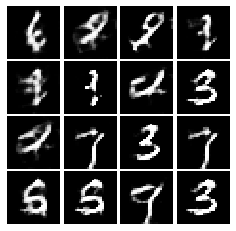

Epoch: 3, Iter: 1420, D: 0.4091, G:2.212


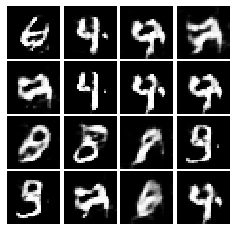

Epoch: 3, Iter: 1440, D: 0.3027, G:3.798


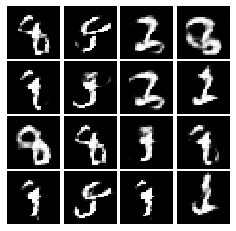

Epoch: 3, Iter: 1460, D: 0.4658, G:3.625


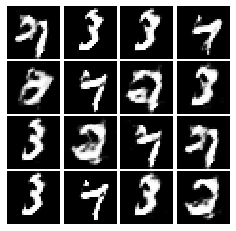

Epoch: 3, Iter: 1480, D: 0.2599, G:3.701


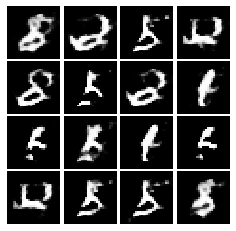

Epoch: 3, Iter: 1500, D: 0.5069, G:3.647


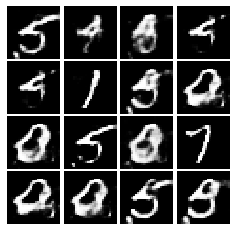

Epoch: 3, Iter: 1520, D: 0.4574, G:2.562


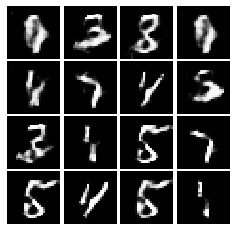

Epoch: 3, Iter: 1540, D: 0.5263, G:3.064


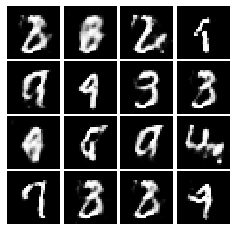

Epoch: 3, Iter: 1560, D: 0.4481, G:2.852


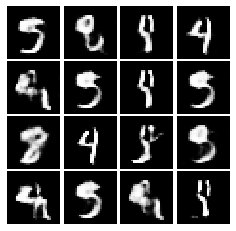

Epoch: 3, Iter: 1580, D: 0.6277, G:2.256


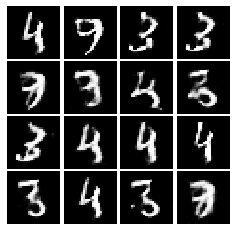

Epoch: 3, Iter: 1600, D: 0.4239, G:3.214


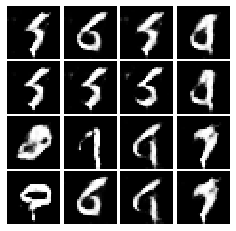

Epoch: 3, Iter: 1620, D: 0.3784, G:3.413


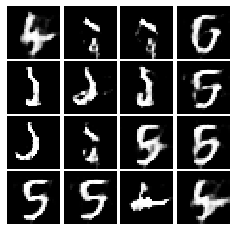

Epoch: 3, Iter: 1640, D: 0.3811, G:3.245


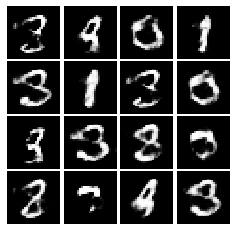

Epoch: 3, Iter: 1660, D: 0.6988, G:7.446


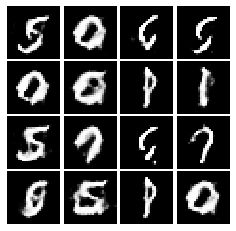

Epoch: 3, Iter: 1680, D: 0.4183, G:3.041


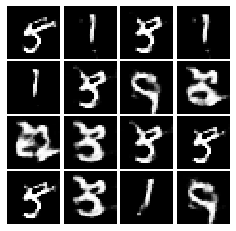

Epoch: 3, Iter: 1700, D: 0.7517, G:1.98


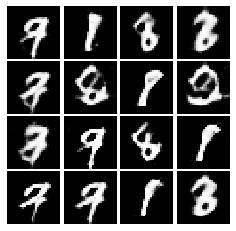

Epoch: 3, Iter: 1720, D: 0.6176, G:2.562


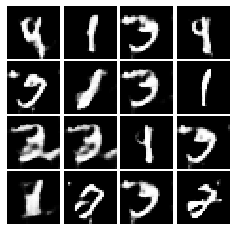

Epoch: 3, Iter: 1740, D: 0.5971, G:2.456


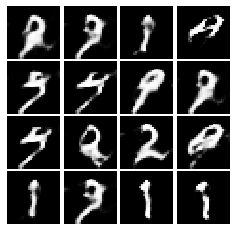

Epoch: 3, Iter: 1760, D: 0.3666, G:3.097


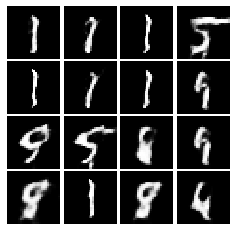

Epoch: 3, Iter: 1780, D: 0.4803, G:2.544


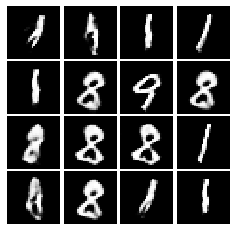

Epoch: 3, Iter: 1800, D: 0.5434, G:2.594


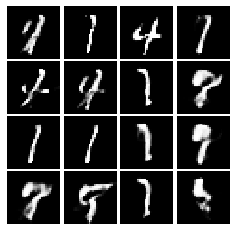

Epoch: 3, Iter: 1820, D: 0.6123, G:3.084


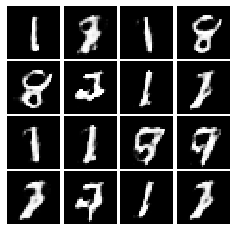

Epoch: 3, Iter: 1840, D: 0.4833, G:1.75


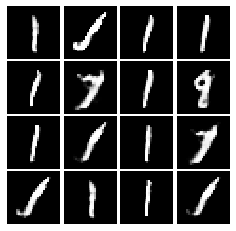

Epoch: 3, Iter: 1860, D: 0.5222, G:2.335


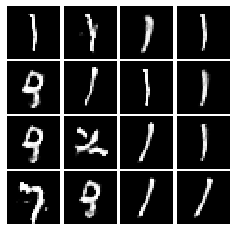

Epoch: 4, Iter: 1880, D: 0.4711, G:2.551


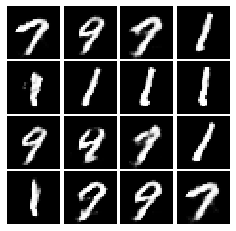

Epoch: 4, Iter: 1900, D: 0.6085, G:3.047


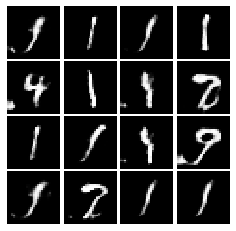

Epoch: 4, Iter: 1920, D: 0.4878, G:2.292


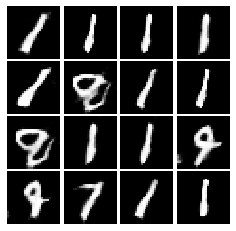

Epoch: 4, Iter: 1940, D: 0.4327, G:2.341


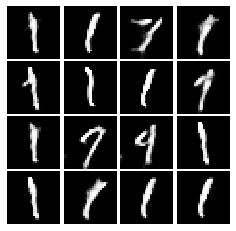

Epoch: 4, Iter: 1960, D: 0.3629, G:2.912


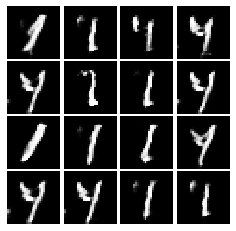

Epoch: 4, Iter: 1980, D: 0.4806, G:2.787


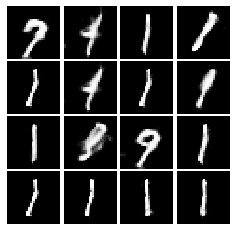

Epoch: 4, Iter: 2000, D: 0.5664, G:2.031


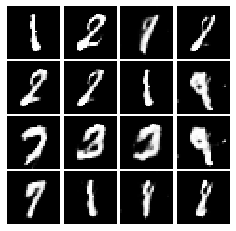

Epoch: 4, Iter: 2020, D: 0.5827, G:2.547


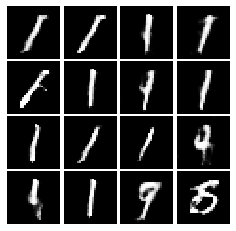

Epoch: 4, Iter: 2040, D: 0.5046, G:2.908


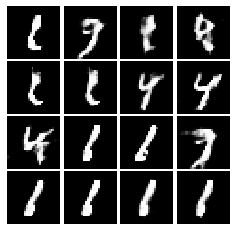

Epoch: 4, Iter: 2060, D: 0.2908, G:2.949


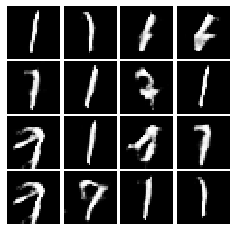

Epoch: 4, Iter: 2080, D: 0.5151, G:2.132


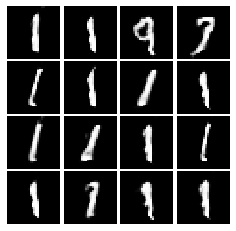

Epoch: 4, Iter: 2100, D: 0.4041, G:2.408


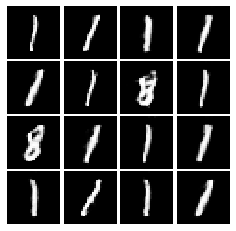

Epoch: 4, Iter: 2120, D: 0.4394, G:2.232


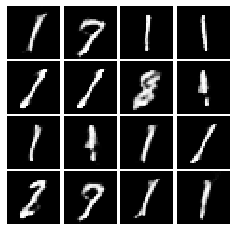

Epoch: 4, Iter: 2140, D: 0.6167, G:2.527


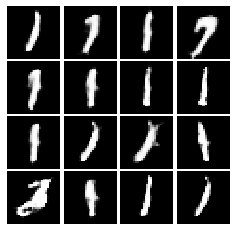

Epoch: 4, Iter: 2160, D: 0.5253, G:2.276


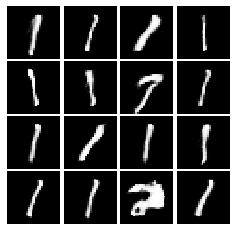

Epoch: 4, Iter: 2180, D: 0.2615, G:3.673


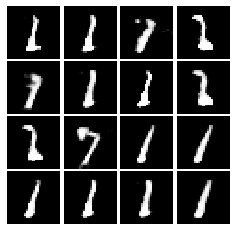

Epoch: 4, Iter: 2200, D: 0.6236, G:2.527


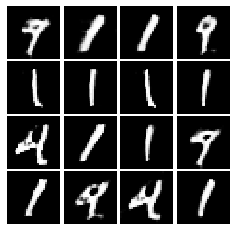

Epoch: 4, Iter: 2220, D: 0.3707, G:2.837


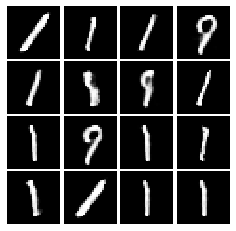

Epoch: 4, Iter: 2240, D: 0.4367, G:2.354


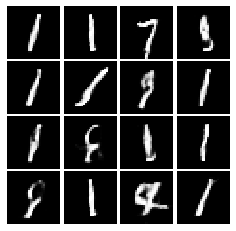

Epoch: 4, Iter: 2260, D: 0.3608, G:2.571


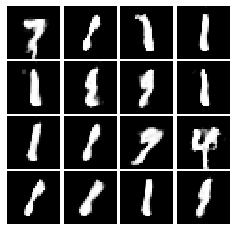

Epoch: 4, Iter: 2280, D: 0.3411, G:2.49


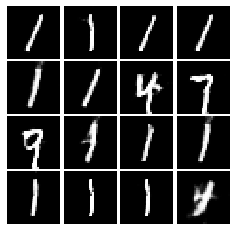

Epoch: 4, Iter: 2300, D: 0.4191, G:2.863


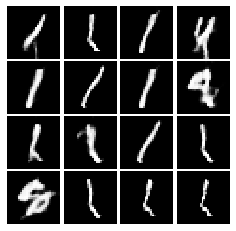

Epoch: 4, Iter: 2320, D: 0.3768, G:2.792


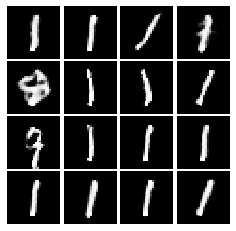

Epoch: 4, Iter: 2340, D: 0.3674, G:2.69


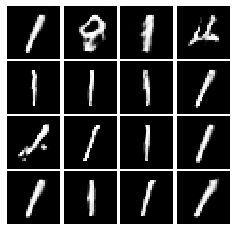

Final images


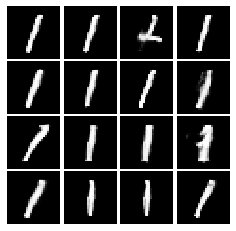

In [0]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |    |      |      |      |       |       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1  |       |       |       |       |       |       
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
It means that the generator is getting stronger faster than the discriminator.

*Many thanks to Stanford CS231n for permission to use their materials!*